In [7]:
%matplotlib inline
%config InlineBackend.figure_format='retina'

# import everything we need first
from keras import utils
import numpy as np
from sklearn.model_selection import train_test_split
import pylab as plt



#from astroNN.models import Galaxy10CNN
#from astroNN.datasets import galaxy10
#from astroNN.datasets.galaxy10 import galaxy10cls_lookup, galaxy10_confusion


In [8]:
import h5py
import numpy as np
from tensorflow.keras import utils

# To get the images and labels from file
with h5py.File('Galaxy10.h5', 'r') as F:
    images = np.array(F['images'])
    labels = np.array(F['ans'])

# To convert the labels to categorical 10 classes
labels = utils.to_categorical(labels, 10)

# To convert to desirable type
labels = labels.astype(np.float32)
images = images.astype(np.float32)

In [9]:
images.shape

(21785, 69, 69, 3)

In [10]:
np.max(images)

255.0

In [11]:
labels.shape

(21785, 10)

In [72]:
labelname=["Disk, Face-on, No Spiral",
    "Smooth, Completely round",
"Smooth, in-between round",
"Smooth, Cigar shaped",
"Disk, Edge-on, Rounded Bulge",
"Disk, Edge-on, Boxy Bulge",
" Disk, Edge-on, No Bulge",
" Disk, Face-on, Tight Spiral",
" Disk, Face-on, Medium Spiral",
"Disk, Face-on, Loose Spiral"]

===================Data Inspection===================


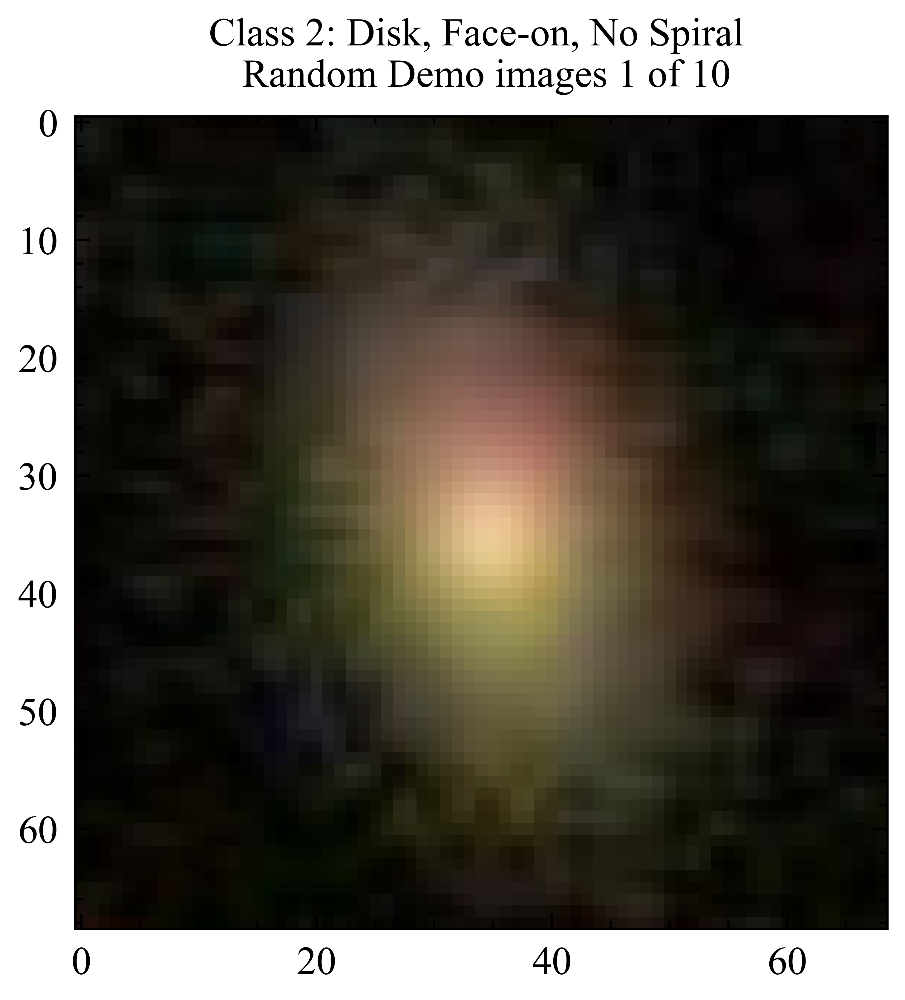

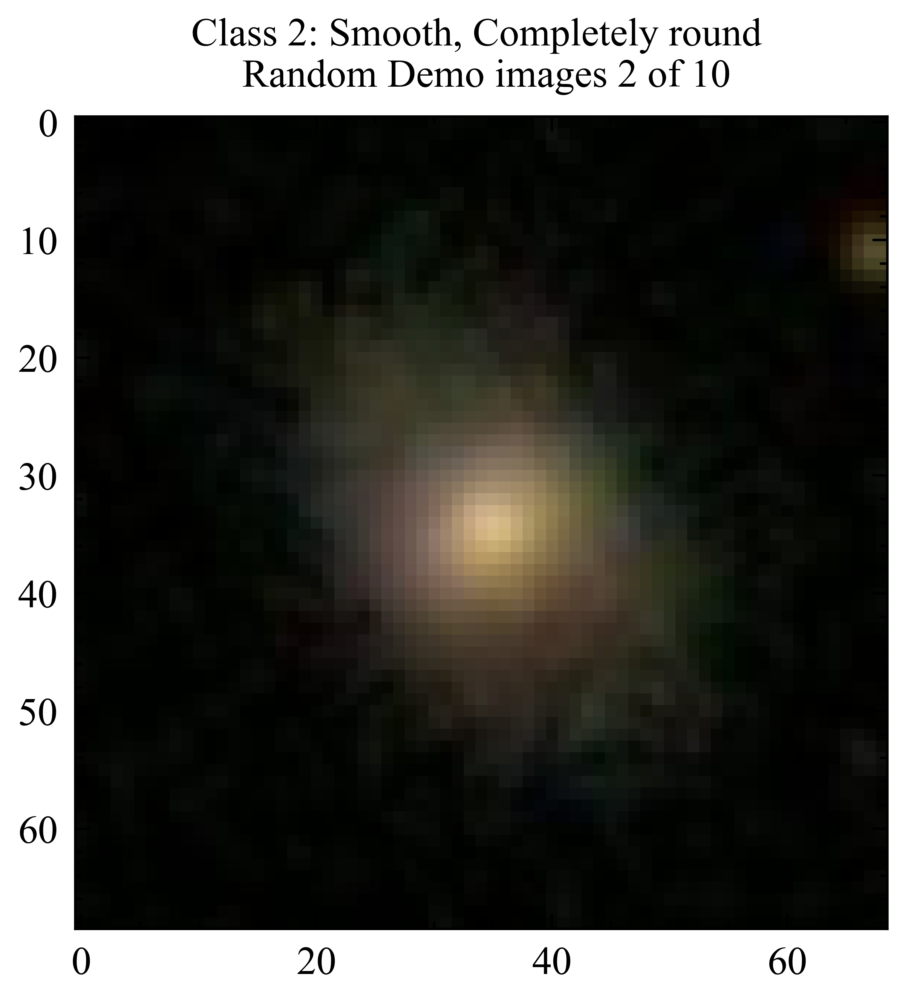

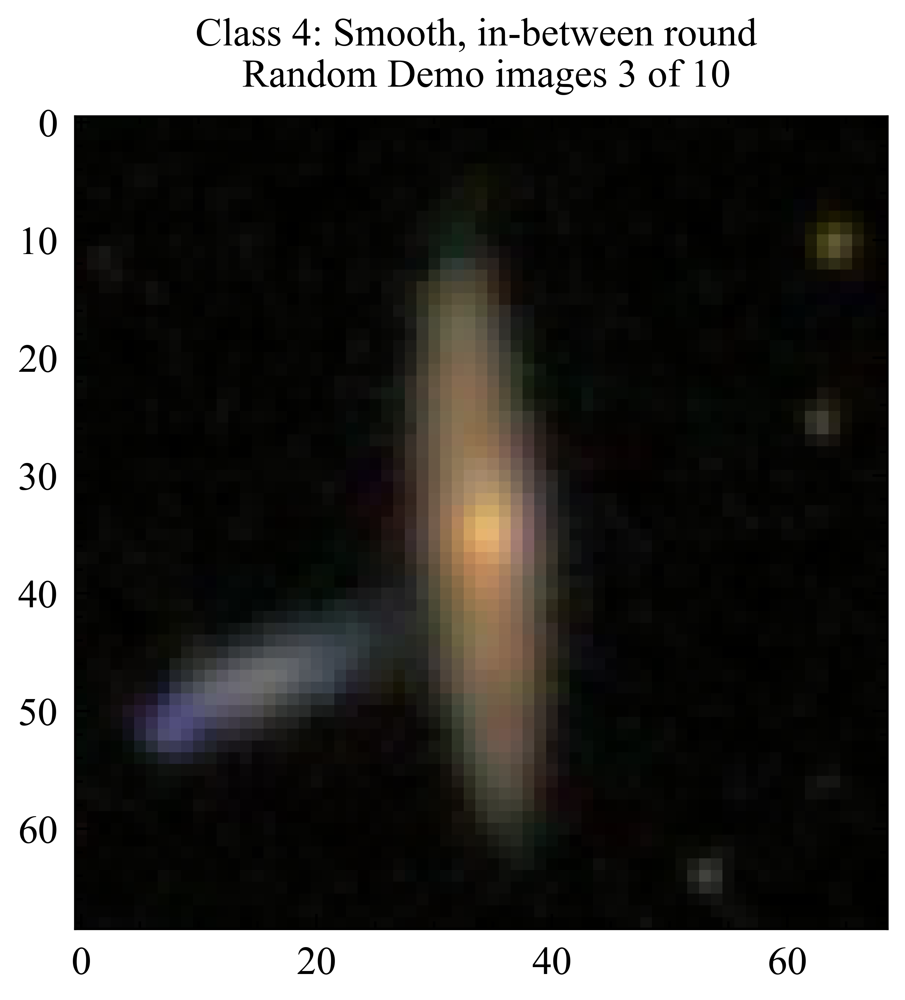

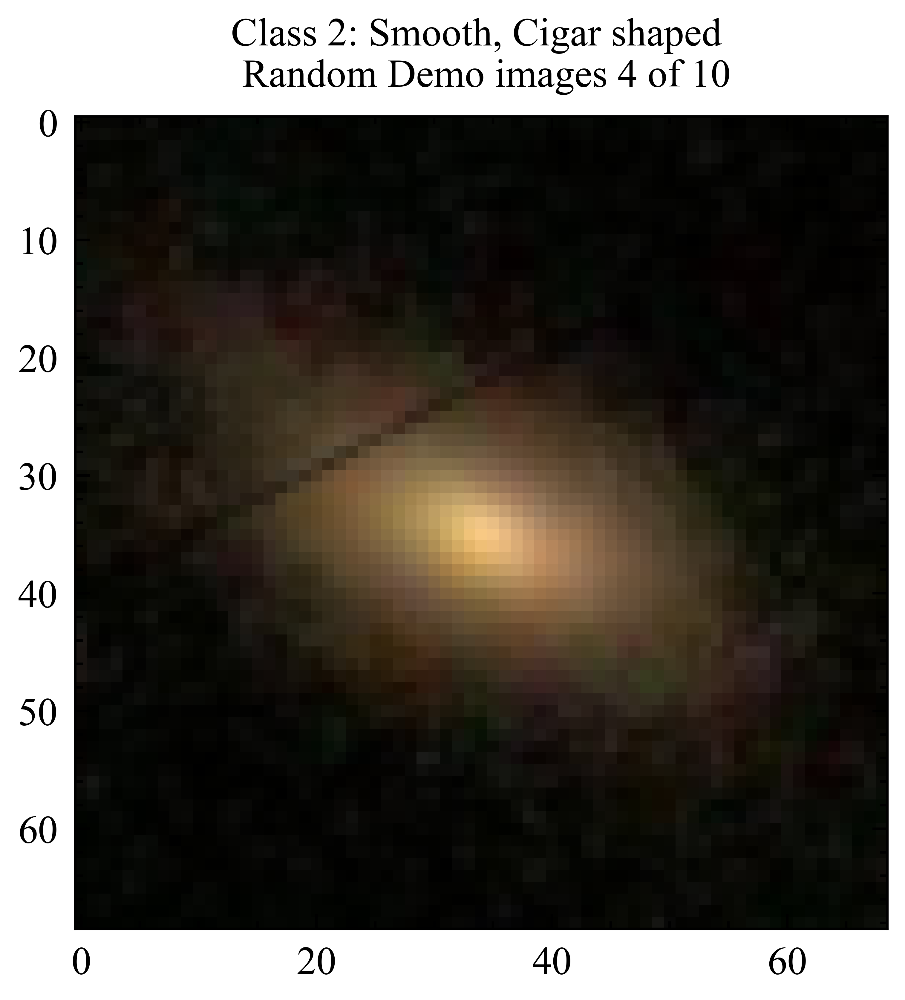

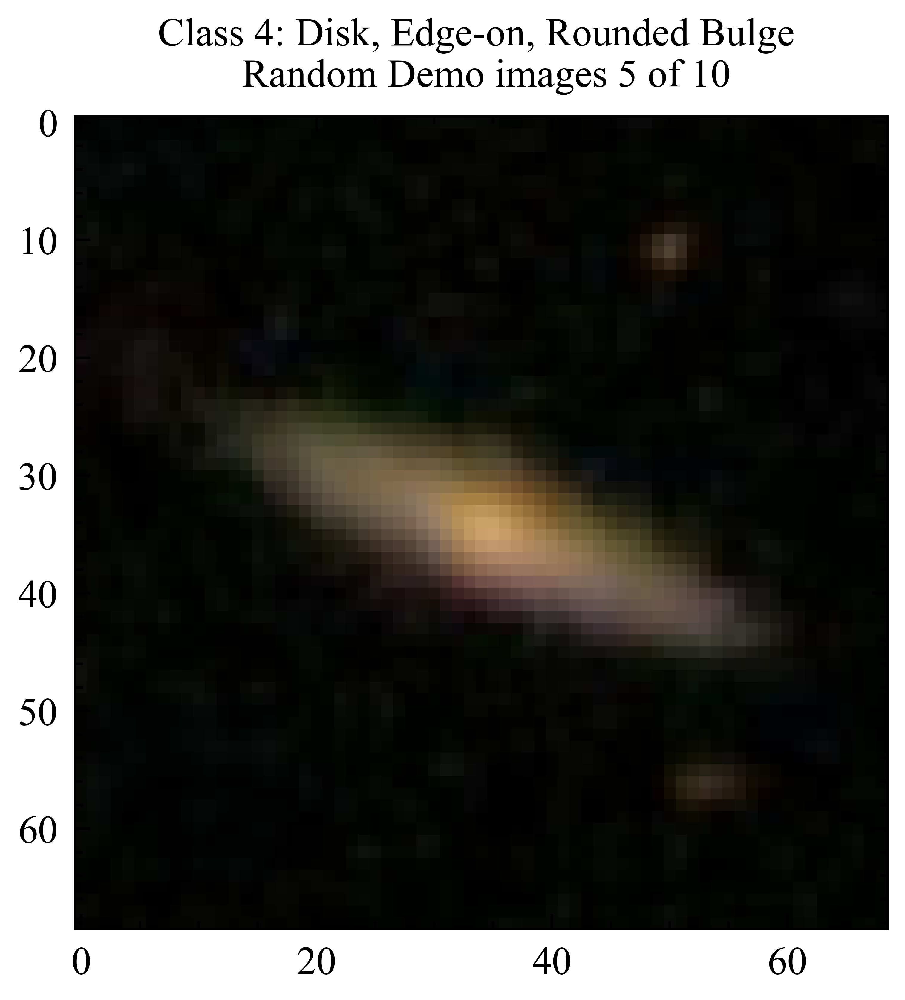

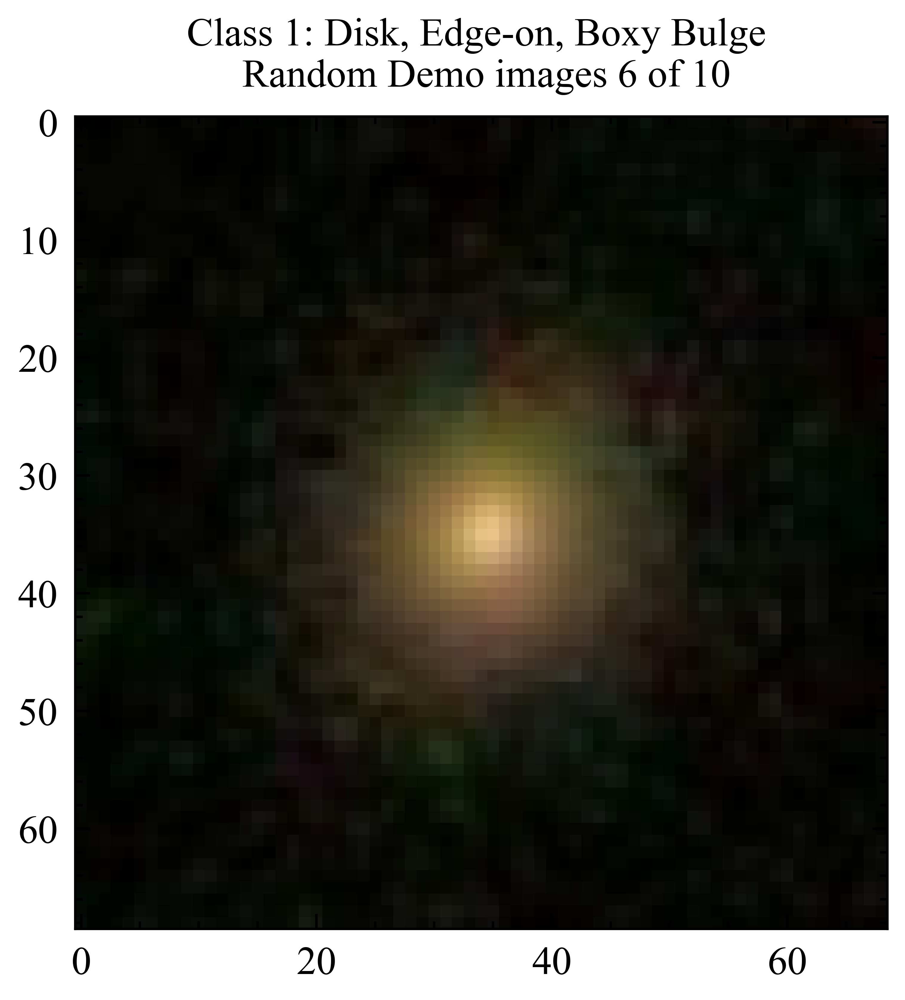

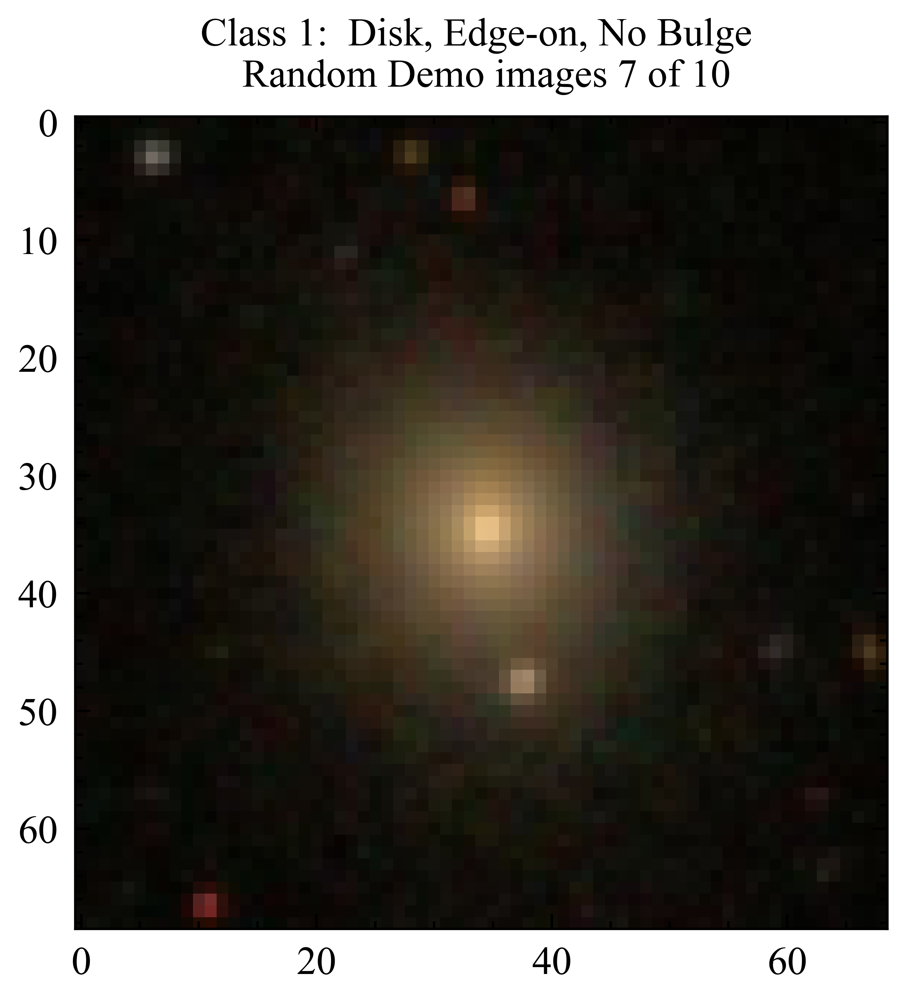

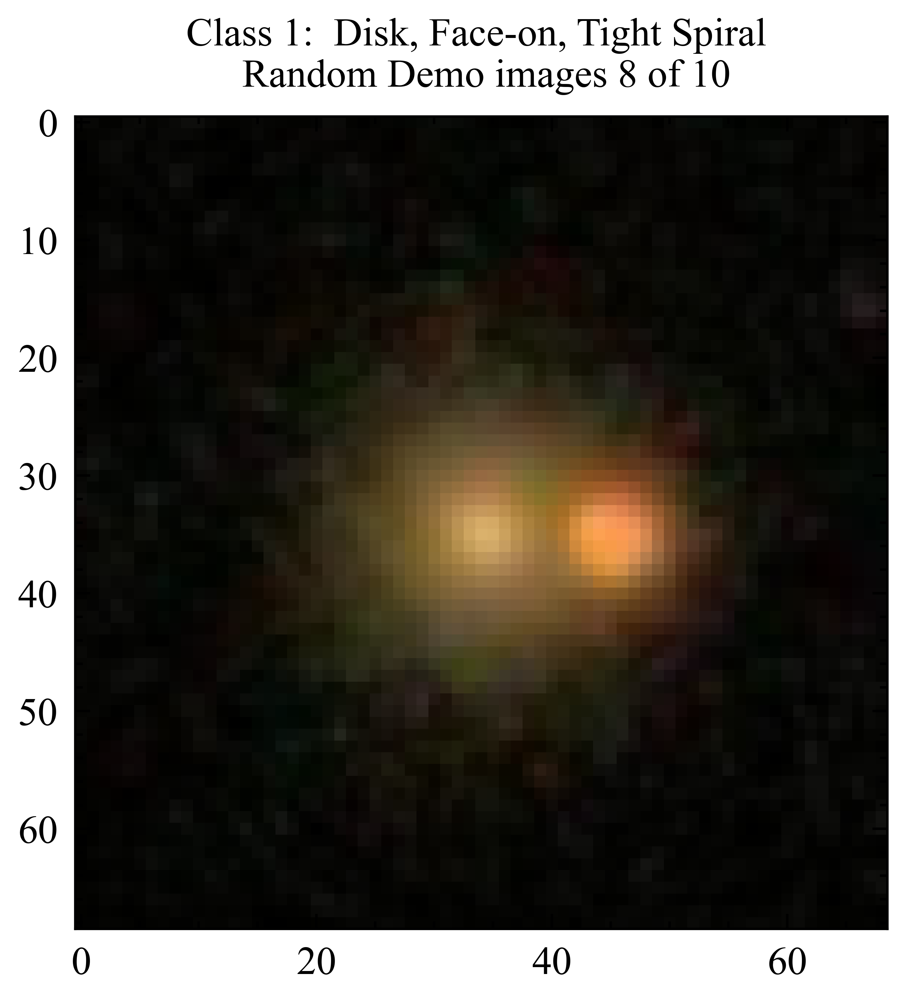

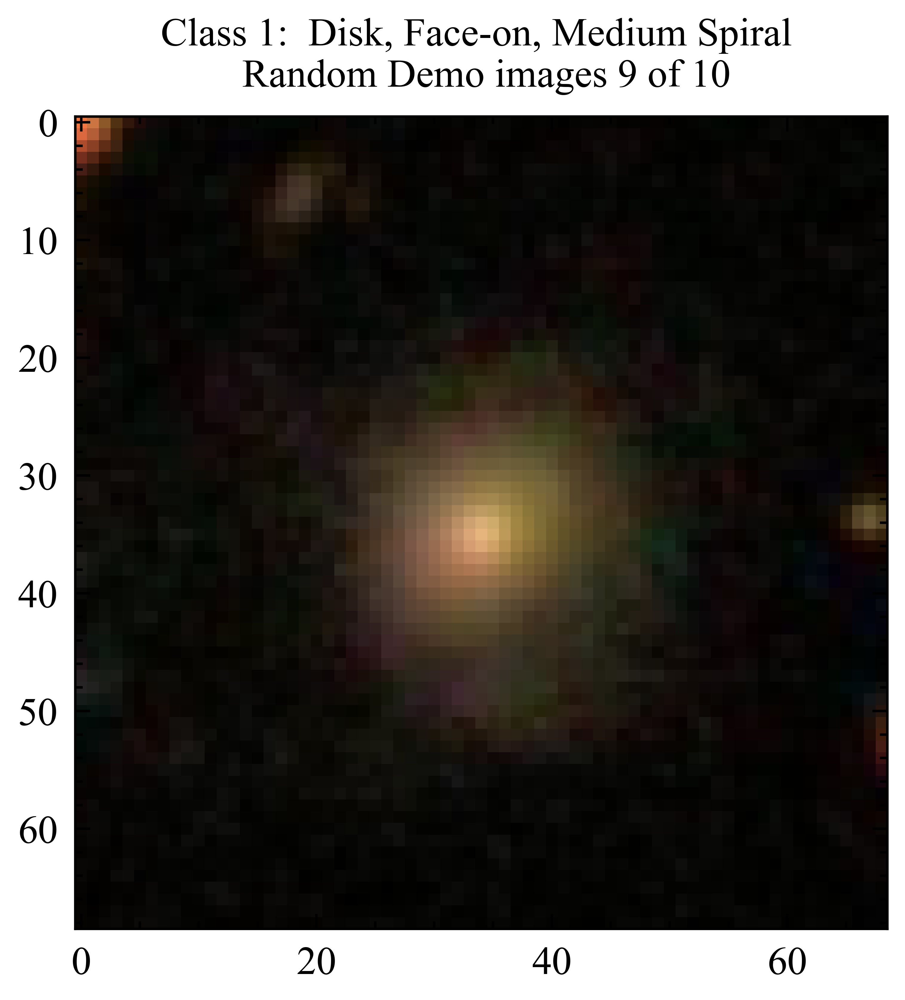

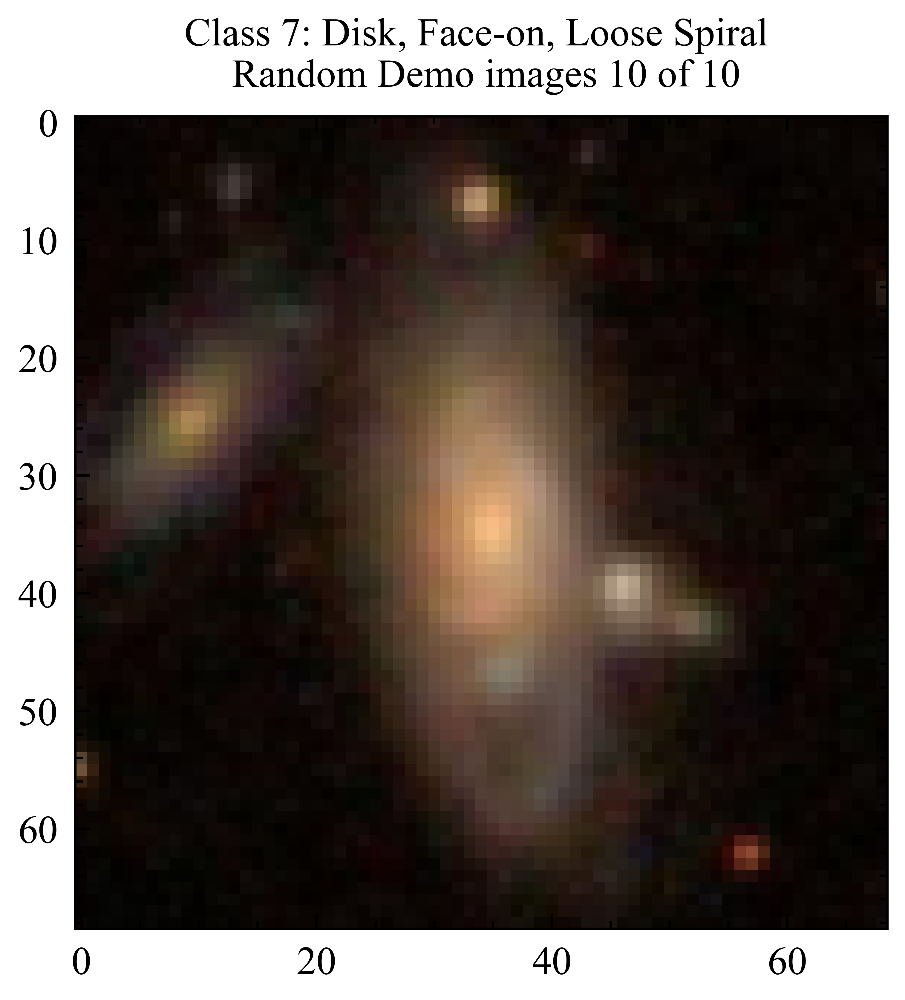

===============Data Inspection Finished===============


In [76]:
img = None
plt.ion()
print('===================Data Inspection===================')
for counter, i in enumerate(range(np.random.randint(0, labels.shape[0], size=10).shape[0])):
    plt.figure(figsize=[3,3])
    img = plt.imshow(images[i]/255)
    
    plt.title('Class {}: {} \n Random Demo images {} of 10'.format(np.argmax(labels[i]), labelname[i],counter+1),fontsize=8)
    plt.draw()
    plt.pause(.3)
plt.close('all')
print('===============Data Inspection Finished===============')

In [106]:
import tensorflow as tf

#图像标准化

images = tf.image.per_image_standardization(images) 

In [11]:
import numpy as np
from sklearn.model_selection import train_test_split

train_idx, test_idx = train_test_split(np.arange(labels.shape[0]), test_size=0.1)
train_images, train_labels, test_images, test_labels = images[train_idx], labels[train_idx], images[test_idx], labels[test_idx]

In [12]:
hist_train=np.zeros(10)
hist_test=np.zeros(10)
for i in range(train_labels.shape[0]):
    num=np.argmax(train_labels[i])
    hist_train[num]+=1
for i in range(test_labels.shape[0]):
    num=np.argmax(test_labels[i])
    hist_test[num]+=1

In [13]:
hist_train

array([3083., 6305., 5676.,  312., 1387.,   17.,  544.,  991.,  822.,
        469.])

In [14]:
hist_test

array([378., 692., 616.,  37., 147.,   0.,  45., 130.,  84.,  50.])

In [25]:
plt.style.use(['science','ieee'])

Text(0.5, 0, 'Each class')

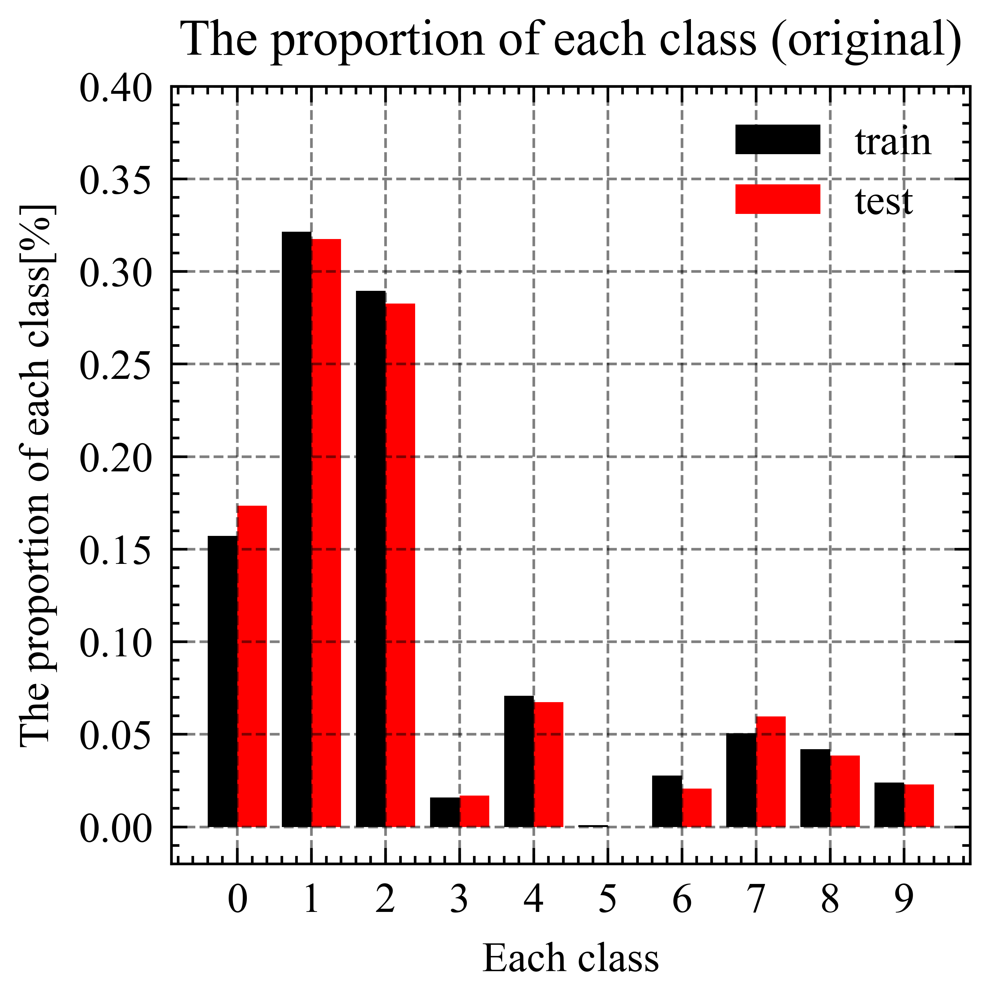

In [49]:
from matplotlib.pyplot import MultipleLocator

plt.figure(figsize=[2.7,2.7])
plt.bar(np.arange(10)-0.2,hist_train/train_labels.shape[0],width=0.4,label='train')

plt.bar(np.arange(10)+0.2,hist_test/test_labels.shape[0],width=0.4,label='test')
plt.grid('off')

x_major_locator=MultipleLocator(1)
ax=plt.gca()
#ax为两条坐标轴的实例
ax.xaxis.set_major_locator(x_major_locator)

plt.ylim(-0.02,0.4)
plt.legend()
plt.title('The proportion of each class (original)')
plt.ylabel('The proportion of each class[%]')
plt.xlabel('Each class')

In [103]:
def trans(image):
    image[:,:,0]=image[:,:,0].T
    image[:,:,1]=image[:,:,1].T
    image[:,:,2]=image[:,:,2].T
    
def tranflip(image,axis0):
    image[:,:,0]=np.flip(image[:,:,0],axis=axis0)
    image[:,:,1]=np.flip(image[:,:,1],axis=axis0)
    image[:,:,2]=np.flip(image[:,:,2],axis=axis0)

In [123]:
import tqdm

labelsnew=labels.copy()
imagesnew=images.copy()
leng=labels.shape[0]
for i in tqdm.tqdm(np.arange(leng)):
    num=np.argmax(labels[i])
    if num>=3:
        labelsnew=np.vstack((labelsnew,labels[i]))
        leng+=1
        trans_image=images[i].copy()
        #print(trans_image)
        trans(trans_image)
        #print(trans_image)
        imagesnew=np.append(imagesnew,trans_image).reshape([leng,69,69,3])
        
        labelsnew=np.vstack((labelsnew,labels[i]))
        leng+=1
        trans_image=images[i].copy()
        tranflip(trans_image,0)
        imagesnew=np.append(imagesnew,trans_image).reshape([leng,69,69,3])
        
        labelsnew=np.vstack((labelsnew,labels[i]))
        leng+=1
        trans_image=images[i].copy()
        tranflip(trans_image,1)
        imagesnew=np.append(imagesnew,trans_image).reshape([leng,69,69,3])
        
        
        
        

100%|██████████| 21785/21785 [2:11:42<00:00,  2.76it/s]  


In [124]:
import numpy as np
from sklearn.model_selection import train_test_split

train_idx, test_idx = train_test_split(np.arange(labelsnew.shape[0]), test_size=0.1)
train_images, train_labels, test_images, test_labels = imagesnew[train_idx], labelsnew[train_idx], imagesnew[test_idx], labelsnew[test_idx]

In [27]:
hist_train=np.zeros(10)
hist_test=np.zeros(10)
for i in range(train_labels.shape[0]):
    num=np.argmax(train_labels[i])
    hist_train[num]+=1
for i in range(test_labels.shape[0]):
    num=np.argmax(test_labels[i])
    hist_test[num]+=1

Text(0.5, 0, 'Each class')

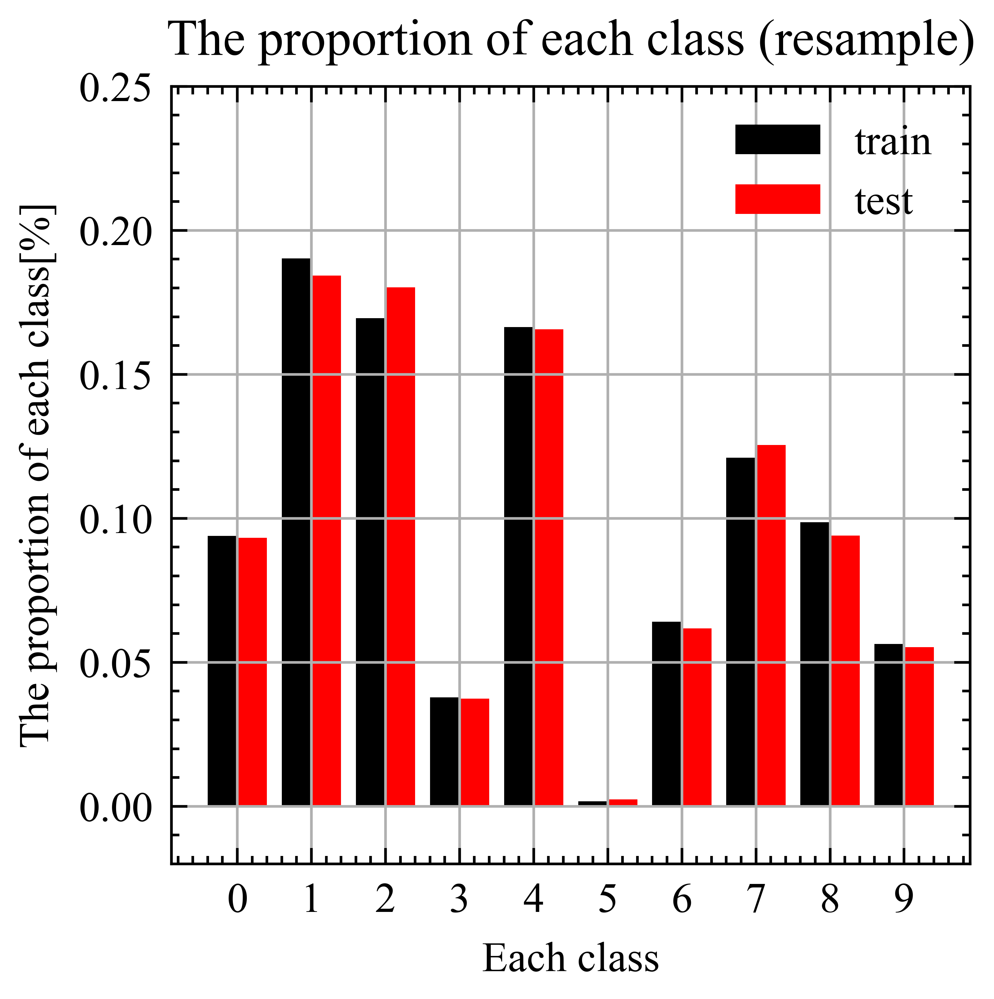

In [32]:
from matplotlib.pyplot import MultipleLocator

plt.figure(figsize=[2.7,2.7])
plt.bar(np.arange(10)-0.2,hist_train/train_labels.shape[0],width=0.4,label='train')

plt.bar(np.arange(10)+0.2,hist_test/test_labels.shape[0],width=0.4,label='test')
plt.grid('off')

x_major_locator=MultipleLocator(1)
ax=plt.gca()
#ax为两条坐标轴的实例
ax.xaxis.set_major_locator(x_major_locator)

plt.ylim(-0.02,0.25)
plt.legend()
plt.title('The proportion of each class (resample)')
plt.ylabel('The proportion of each class[%]')
plt.xlabel('Each class')

Text(0.5, 0, 'Each class')

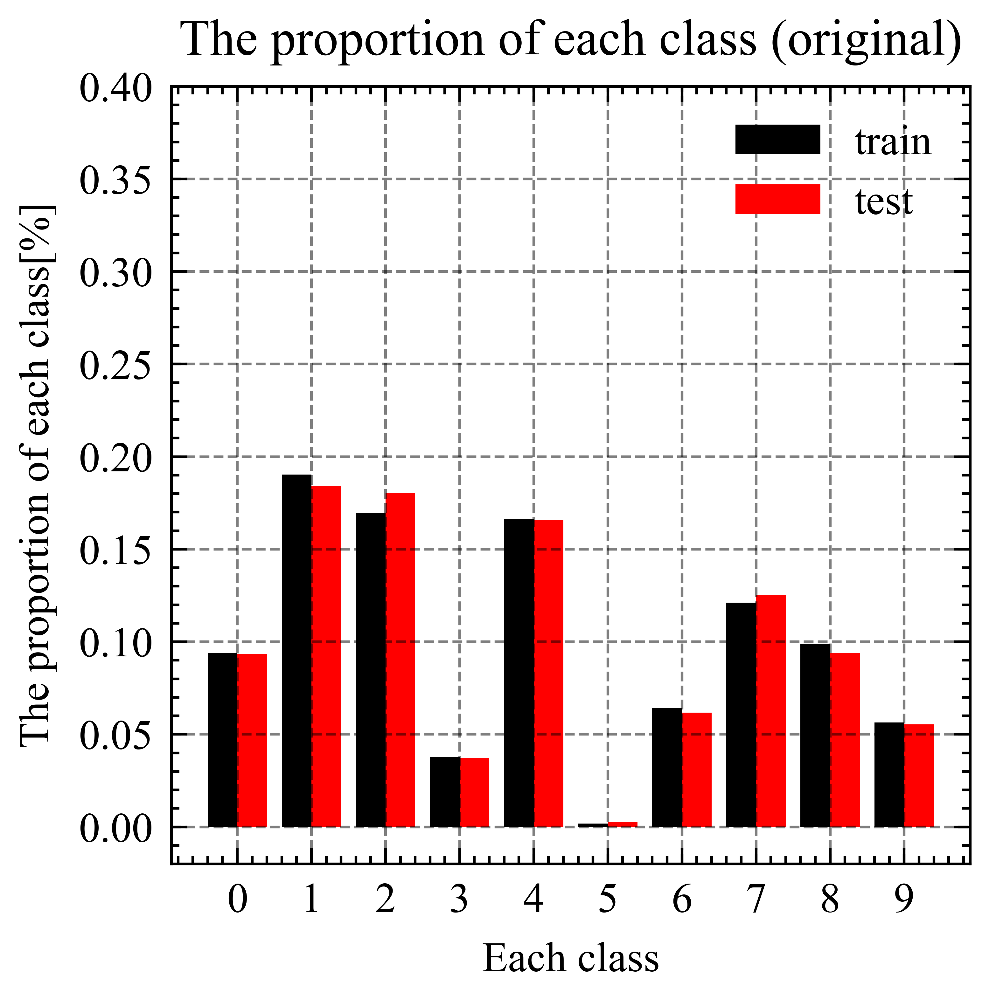

In [126]:
from matplotlib.pyplot import MultipleLocator

plt.figure(figsize=[2.7,2.7])
plt.bar(np.arange(10)-0.2,hist_train/train_labels.shape[0],width=0.4,label='train')

plt.bar(np.arange(10)+0.2,hist_test/test_labels.shape[0],width=0.4,label='test')
plt.grid('off')

x_major_locator=MultipleLocator(1)
ax=plt.gca()
#ax为两条坐标轴的实例
ax.xaxis.set_major_locator(x_major_locator)

plt.ylim(-0.02,0.4)
plt.legend()
plt.title('The proportion of each class (resample)')
plt.ylabel('The proportion of each class[%]')
plt.xlabel('Each class')

In [127]:
np.save('/data/dell5/userdir/chenhx/galaxy10/resnet_models/train_images.npy',train_images)
np.save('/data/dell5/userdir/chenhx/galaxy10/resnet_models/train_labels.npy',train_labels)
np.save('/data/dell5/userdir/chenhx/galaxy10/resnet_models/test_images.npy',test_images)
np.save('/data/dell5/userdir/chenhx/galaxy10/resnet_models/test_labels.npy',test_labels)
np.save('/data/dell5/userdir/chenhx/galaxy10/resnet_models/train_idx.npy',train_idx)
np.save('/data/dell5/userdir/chenhx/galaxy10/resnet_models/test_idx.npy',test_idx)




In [14]:
train_images=np.load('/data/dell5/userdir/chenhx/galaxy10/resnet_models/train_images.npy')
train_labels=np.load('/data/dell5/userdir/chenhx/galaxy10/resnet_models/train_labels.npy')
test_images=np.load('/data/dell5/userdir/chenhx/galaxy10/resnet_models/test_images.npy')
test_labels=np.load('/data/dell5/userdir/chenhx/galaxy10/resnet_models/test_labels.npy')
train_idx=np.load('/data/dell5/userdir/chenhx/galaxy10/resnet_models/train_idx.npy')
test_idx=np.load('/data/dell5/userdir/chenhx/galaxy10/resnet_models/test_idx.npy')

In [ ]:
##########最佳模型！！！！！！！！！！！！！

In [16]:
##########最佳模型！！！！！！！！！！！！！
##########最佳模型！！！！！！！！！！！！！
##########最佳模型！！！！！！！！！！！！！
#缩小网络规模
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPooling2D, GlobalAveragePooling2D, Dense, Add
from tensorflow.keras.models import Model
import numpy as np
import os
from tensorflow.keras.optimizers import Adam

# 定义基本块
def basic_block(x, filters, stride=1):
    #print("Input shape:", x.shape)
    shortcut = x

    # 第一个卷积层
    x = Conv2D(filters, kernel_size=(3, 3), strides=stride, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # 第二个卷积层
    x = Conv2D(filters, kernel_size=(3, 3), strides=1, padding='same')(x)
    x = BatchNormalization()(x)

    # 如果步幅不为 1，或输入和输出通道数不匹配，则需要对 shortcut 进行调整
    if stride != 1 or shortcut.shape[-1] != filters:
        shortcut = Conv2D(filters, kernel_size=(1, 1), strides=stride, padding='same')(shortcut)
        shortcut = BatchNormalization()(shortcut)
    #print("Skip connection shape:", x.shape)

    # 添加 shortcut 到主路径上
    x = Add()([x, shortcut])
    x = Activation('relu')(x)
    #print("Output shape:", x.shape)

    return x

# 定义 ResNet 结构
def ResNet(input_shape, num_classes):
    inputs = Input(shape=input_shape)

    # 第一层卷积
    x = Conv2D(64, kernel_size=(7, 7), strides=2, padding='same')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D(pool_size=(3, 3), strides=2, padding='same')(x)

    # 堆叠残差块
    x = basic_block(x, filters=64, stride=1)
    x = basic_block(x, filters=64, stride=1)
    x = basic_block(x, filters=64, stride=1)

    x = basic_block(x, filters=128, stride=2)
    x = basic_block(x, filters=128, stride=1)
    x = basic_block(x, filters=128, stride=1)
    #x = basic_block(x, filters=128, stride=1)

    x = basic_block(x, filters=256, stride=2)
    x = basic_block(x, filters=256, stride=1)
    x = basic_block(x, filters=256, stride=1)
    #x = basic_block(x, filters=256, stride=1)
    #x = basic_block(x, filters=256, stride=1)
    #x = basic_block(x, filters=256, stride=1)

    x = basic_block(x, filters=512, stride=2)
    x = basic_block(x, filters=512, stride=1)
    #x = basic_block(x, filters=512, stride=1)

    # 全局平均池化
    x = GlobalAveragePooling2D()(x)

    # 全连接层 增加了两层
    x = Dense(256, activation='relu')(x)
    x = Dense(64, activation='relu')(x)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs, outputs)
    return model


def prepare_data(train_images, train_labels, test_images, test_labels):
    
    trlabels=np.zeros(train_labels.shape[0])
    telabels=np.zeros(test_labels.shape[0])
   
    for i in range(train_labels.shape[0]):
        trlabels[i]=np.argmax(train_labels[i])
    for i in range(test_labels.shape[0]):
        telabels[i]=np.argmax(test_labels[i])
    
    return trlabels,  telabels

# 模型训练
def train_model():
    input_shape = (69, 69, 3)
    num_classes = 10

    
    model = ResNet(input_shape, num_classes)
    
    model.summary()
    
    optimizer = Adam(learning_rate=0.001)

# 将优化器对象传入compile函数中
    model.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

    trlabels,  telabels=prepare_data(train_images, train_labels, test_images, test_labels)
    
    # 训练模型并保存每个epoch的模型
    for epoch in range(30):  
        model.fit(train_images, trlabels, batch_size=64, epochs=1, validation_data=(test_images, telabels))
        model.save(f'/data/dell5/userdir/chenhx/galaxy10/resnet_models_resample_sparse/resnet_epoch_{epoch+1}.h5')

    #model.fit(train_images, trlabels, epochs=10, batch_size=32, validation_data=(test_images, telabels))

    return model



# 有没有模型
if not os.path.exists('/data/dell5/userdir/chenhx/galaxy10/resnet_models_resample_sparse'):
    os.makedirs('/data/dell5/userdir/chenhx/galaxy10/resnet_models_resample_sparse')



trained_model = train_model()



Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 69, 69, 3)]          0         []                            
                                                                                                  
 conv2d_26 (Conv2D)          (None, 35, 35, 64)           9472      ['input_2[0][0]']             
                                                                                                  
 batch_normalization_26 (Ba  (None, 35, 35, 64)           256       ['conv2d_26[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_23 (Activation)  (None, 35, 35, 64)           0         ['batch_normalization_26

 conv2d_35 (Conv2D)          (None, 9, 9, 128)            8320      ['activation_29[0][0]']       
                                                                                                  
 batch_normalization_34 (Ba  (None, 9, 9, 128)            512       ['conv2d_34[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 batch_normalization_35 (Ba  (None, 9, 9, 128)            512       ['conv2d_35[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 add_14 (Add)                (None, 9, 9, 128)            0         ['batch_normalization_34[0][0]
                                                                    ',                            
          

 activation_38 (Activation)  (None, 5, 5, 256)            0         ['batch_normalization_43[0][0]
                                                                    ']                            
                                                                                                  
 conv2d_44 (Conv2D)          (None, 5, 5, 256)            590080    ['activation_38[0][0]']       
                                                                                                  
 batch_normalization_44 (Ba  (None, 5, 5, 256)            1024      ['conv2d_44[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 add_18 (Add)                (None, 5, 5, 256)            0         ['batch_normalization_44[0][0]
                                                                    ',                            
          

 dense_5 (Dense)             (None, 64)                   16448     ['dense_4[0][0]']             
                                                                                                  
 dense_6 (Dense)             (None, 32)                   2080      ['dense_5[0][0]']             
                                                                                                  
 dense_7 (Dense)             (None, 10)                   330       ['dense_6[0][0]']             
                                                                                                  
Total params: 12893866 (49.19 MB)
Trainable params: 12882474 (49.14 MB)
Non-trainable params: 11392 (44.50 KB)
__________________________________________________________________________________________________
519/519 [==============================] - 100s 172ms/step - loss: 1.1366 - accuracy: 0.5790 - val_loss: 2.1706 - val_accuracy: 0.4337


/home/chenghx/anaconda3/lib/python3.8/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


519/519 [==============================] - 68s 132ms/step - loss: 0.0498 - accuracy: 0.9830 - val_loss: 1.0036 - val_accuracy: 0.8075


In [21]:
# 模型测试
def test_model(model):
    
    loss, accuracy = model.evaluate(test_images, telabels)
    print("Test Loss:", loss)
    print("Test Accuracy:", accuracy)
    
#输出结果
def predict_image(test_images, telabels, model):
    
    predictions = model.predict(test_images)
    predicted_label=np.zeros(predictions.shape[0])
    for i in range(predictions.shape[0]):
        predicted_label[i] = np.argmax(predictions[i])
    return predicted_label


loaded_model = tf.keras.models.load_model('/data/dell5/userdir/chenhx/galaxy10/resnet_models_resample_sparse/resnet_epoch_29.h5')
trlabels,  telabels=prepare_data(train_images, train_labels, test_images, test_labels)
pre_labels=predict_image(test_images, telabels, loaded_model)


116/116 [==============================] - 5s 36ms/step


In [22]:
confusion_matrix = np.zeros((10,10))

# create the confusion matrix
for i in range(telabels.shape[0]):
    confusion_matrix[int(pre_labels[i]),int(telabels[i]) ] += 1

confusion_matrix_per = confusion_matrix.copy()

# create the confusion matrix
for i in range(10):
    confusion_matrix_per[i,:] /=np.sum(confusion_matrix,0)

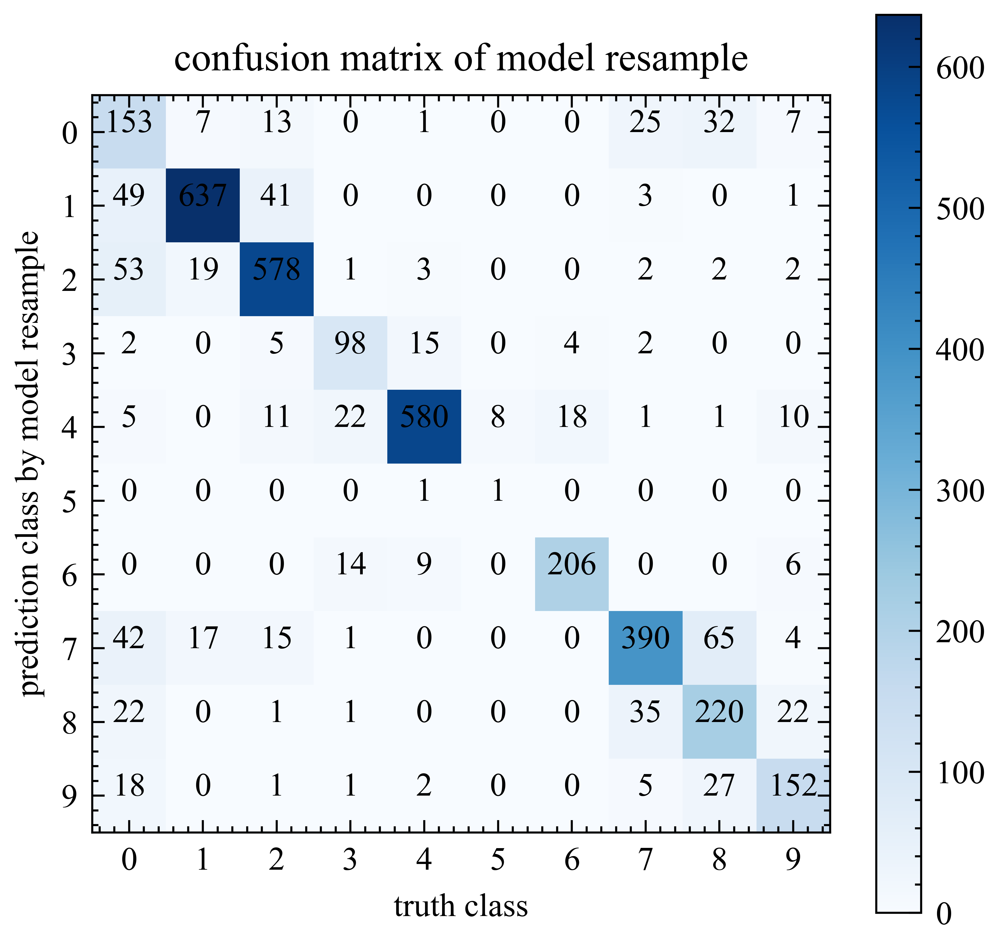

In [30]:
plt.style.use(['science','ieee'])
from matplotlib.pyplot import MultipleLocator

plt.figure(figsize=[4,4])

plt.imshow(confusion_matrix,interpolation='nearest', cmap=plt.cm.Blues)

plt.colorbar()

# 在每个色块上显示对应的数值
for i in range(confusion_matrix.shape[0]):
    for j in range(confusion_matrix.shape[1]):
        plt.text(j, i, format(confusion_matrix[i, j], '.0f'),
                 horizontalalignment="center",
                 color="black" if confusion_matrix[i, j] > 0.5 else "black")
plt.title('confusion matrix of model resample')
plt.ylabel('prediction class by model resample')
plt.xlabel('truth class')

x_major_locator=MultipleLocator(1)
y_major_locator=MultipleLocator(1)
ax=plt.gca()
#ax为两条坐标轴的实例
ax.xaxis.set_major_locator(x_major_locator)
ax.yaxis.set_major_locator(y_major_locator)

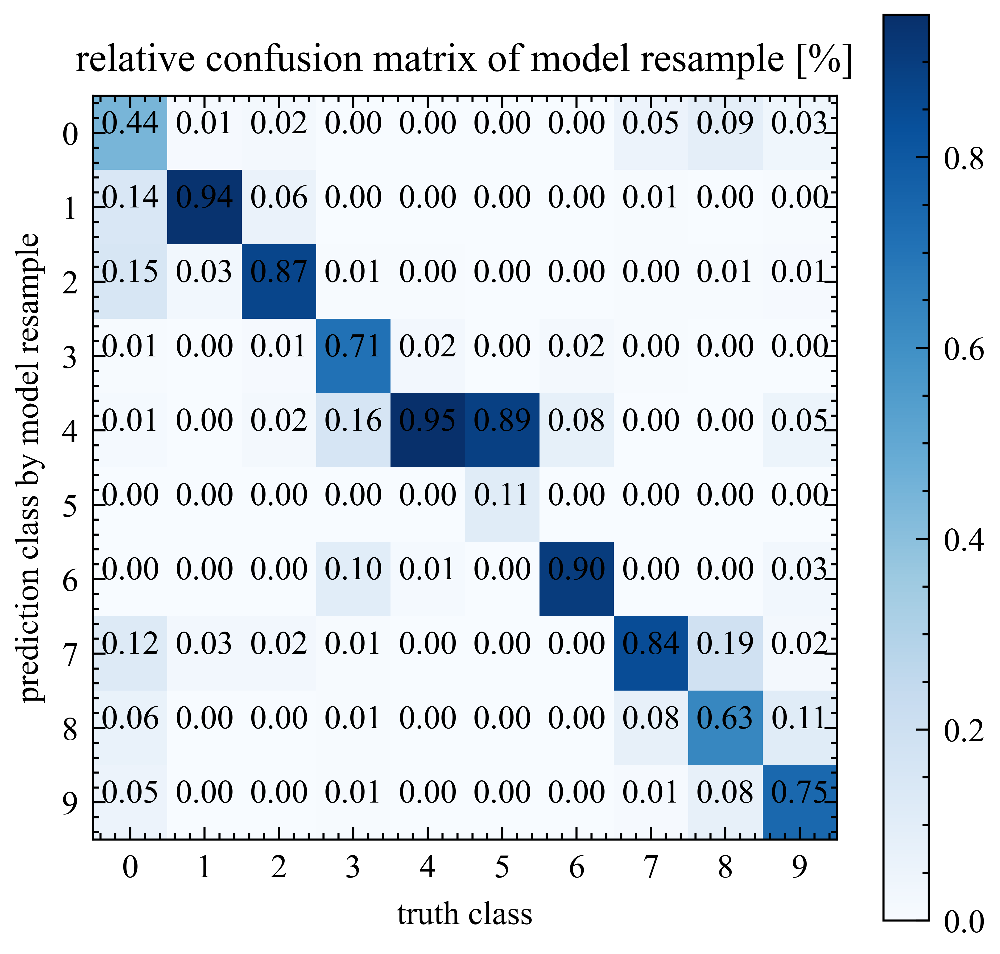

In [31]:
plt.style.use(['science','ieee'])
from matplotlib.pyplot import MultipleLocator

plt.figure(figsize=[4,4])

plt.imshow(confusion_matrix_per,interpolation='nearest', cmap=plt.cm.Blues)

plt.colorbar()

# 在每个色块上显示对应的数值
for i in range(confusion_matrix.shape[0]):
    for j in range(confusion_matrix.shape[1]):
        plt.text(j, i, format(confusion_matrix_per[i, j], '.2f'),
                 horizontalalignment="center",
                 color="black" if confusion_matrix_per[i, j] > 0.5 else "black")
plt.title('relative confusion matrix of model resample [%]')
plt.ylabel('prediction class by model resample')
plt.xlabel('truth class')

x_major_locator=MultipleLocator(1)
y_major_locator=MultipleLocator(1)
ax=plt.gca()
#ax为两条坐标轴的实例
ax.xaxis.set_major_locator(x_major_locator)
ax.yaxis.set_major_locator(y_major_locator)

In [47]:
def basic_block(x, filters, stride=1):
    #print("Input shape:", x.shape)
    shortcut = x

    # 第一个卷积层
    x = Conv2D(filters, kernel_size=(3, 3), strides=stride, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # 第二个卷积层
    x = Conv2D(filters, kernel_size=(3, 3), strides=1, padding='same')(x)
    x = BatchNormalization()(x)

    # 如果步幅不为 1，或输入和输出通道数不匹配，则需要对 shortcut 进行调整
    if stride != 1 or shortcut.shape[-1] != filters:
        shortcut = Conv2D(filters, kernel_size=(1, 1), strides=stride, padding='same')(shortcut)
        shortcut = BatchNormalization()(shortcut)
    #print("Skip connection shape:", x.shape)

    # 添加 shortcut 到主路径上
    x = Add()([x, shortcut])
    x = Activation('relu')(x)
    #print("Output shape:", x.shape)

    return x

# 定义 ResNet 结构
def ResNet(input_shape, num_classes):
    inputs = Input(shape=input_shape)

    # 第一层卷积
    x = Conv2D(64, kernel_size=(7, 7), strides=2, padding='same')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D(pool_size=(3, 3), strides=2, padding='same')(x)

    # 堆叠残差块
    x = basic_block(x, filters=64, stride=1)
    x = basic_block(x, filters=64, stride=1)
    x = basic_block(x, filters=64, stride=1)

    x = basic_block(x, filters=128, stride=2)
    x = basic_block(x, filters=128, stride=1)
    x = basic_block(x, filters=128, stride=1)
    #x = basic_block(x, filters=128, stride=1)

    x = basic_block(x, filters=256, stride=2)
    x = basic_block(x, filters=256, stride=1)
    x = basic_block(x, filters=256, stride=1)
    #x = basic_block(x, filters=256, stride=1)
    #x = basic_block(x, filters=256, stride=1)
    #x = basic_block(x, filters=256, stride=1)

    x = basic_block(x, filters=512, stride=2)
    x = basic_block(x, filters=512, stride=1)
    #x = basic_block(x, filters=512, stride=1)

    # 全局平均池化
    x = GlobalAveragePooling2D()(x)

    # 全连接层 增加了两层
    x = Dense(256, activation='relu')(x)
    x = Dense(64, activation='relu')(x)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs, outputs)
    return model


def prepare_data(train_images, train_labels, test_images, test_labels):
    
    trlabels=np.zeros(train_labels.shape[0])
    telabels=np.zeros(test_labels.shape[0])
   
    for i in range(train_labels.shape[0]):
        trlabels[i]=np.argmax(train_labels[i])
    for i in range(test_labels.shape[0]):
        telabels[i]=np.argmax(test_labels[i])
    
    return trlabels,  telabels

# 模型训练
def train_model():
    input_shape = (69, 69, 3)
    num_classes = 10

    
    model = ResNet(input_shape, num_classes)
    
    model.summary()
    
    optimizer = Adam(learning_rate=0.001)

# 将优化器对象传入compile函数中
    model.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

    trlabels,  telabels=prepare_data(train_images, train_labels, test_images, test_labels)
    
    # 训练模型并保存每个epoch的模型
    for epoch in range(30):  
        model.fit(train_images, trlabels, batch_size=64, epochs=1, validation_data=(test_images, telabels))
        model.save(f'/data/dell5/userdir/chenhx/galaxy10/resnet_models_resample_sparse/resnet_epoch_{epoch+1}.h5')

    #model.fit(train_images, trlabels, epochs=10, batch_size=32, validation_data=(test_images, telabels))

    return model



# 有没有模型
if not os.path.exists('/data/dell5/userdir/chenhx/galaxy10/resnet_models_resample_sparse'):
    os.makedirs('/data/dell5/userdir/chenhx/galaxy10/resnet_models_resample_sparse')




In [48]:
# 模型测试
def test_model(model):
    
    loss, accuracy = model.evaluate(test_images, telabels)
    print("Test Loss:", loss)
    print("Test Accuracy:", accuracy)
    
#输出结果
def predict_image(test_images, telabels, model):
    
    predictions = model.predict(test_images)
    predicted_label=np.zeros(predictions.shape[0])
    for i in range(predictions.shape[0]):
        predicted_label[i] = np.argmax(predictions[i])
    return predicted_label


loaded_model = tf.keras.models.load_model('/data/dell5/userdir/chenhx/galaxy10/resnet_models_resample_sparse/resnet_epoch_26.h5')
trlabels,  telabels=prepare_data(train_images, train_labels, test_images, test_labels)
pre_labels=predict_image(test_images, telabels, loaded_model)


116/116 [==============================] - 4s 33ms/step


In [35]:
confusion_matrix = np.zeros((10,10))

# create the confusion matrix
for i in range(telabels.shape[0]):
    confusion_matrix[int(pre_labels[i]),int(telabels[i]) ] += 1

confusion_matrix_per = confusion_matrix.copy()

# create the confusion matrix
for i in range(10):
    confusion_matrix_per[i,:] /=np.sum(confusion_matrix,0)

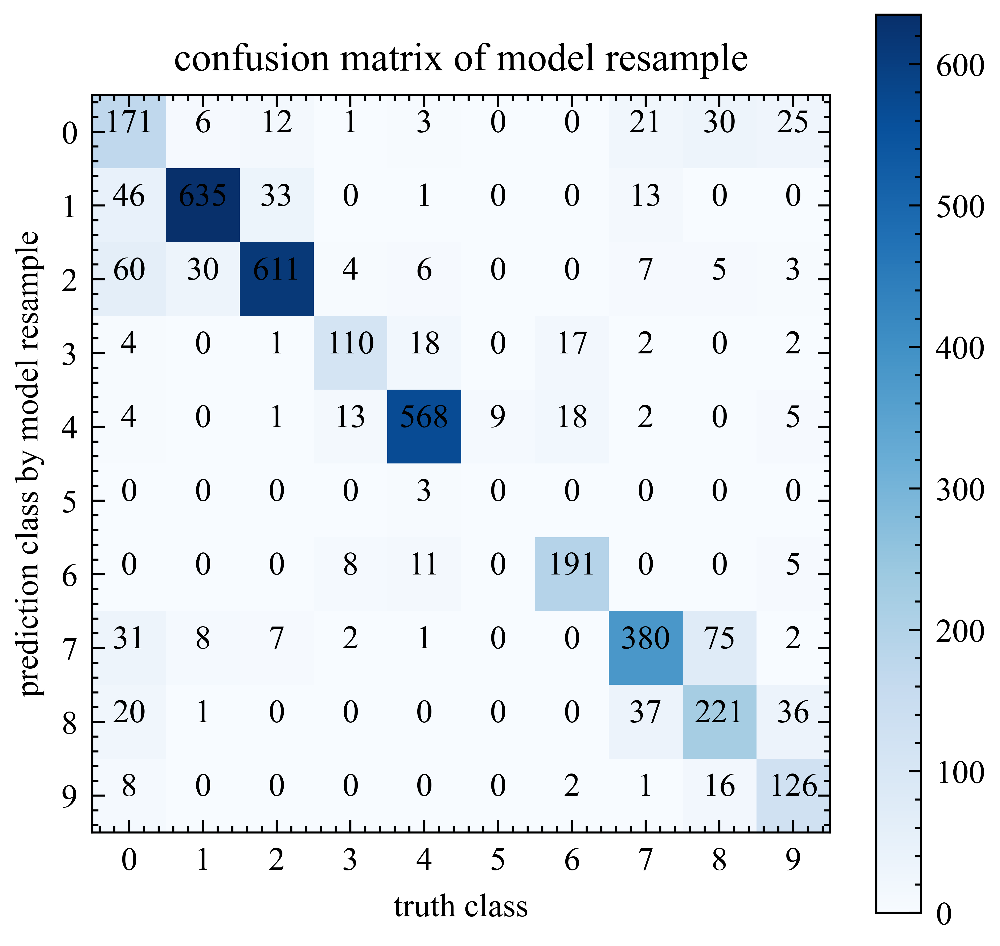

In [36]:
plt.style.use(['science','ieee'])
from matplotlib.pyplot import MultipleLocator

plt.figure(figsize=[4,4])

plt.imshow(confusion_matrix,interpolation='nearest', cmap=plt.cm.Blues)

plt.colorbar()

# 在每个色块上显示对应的数值
for i in range(confusion_matrix.shape[0]):
    for j in range(confusion_matrix.shape[1]):
        plt.text(j, i, format(confusion_matrix[i, j], '.0f'),
                 horizontalalignment="center",
                 color="black" if confusion_matrix[i, j] > 0.5 else "black")
plt.title('confusion matrix of model resample')
plt.ylabel('prediction class by model resample')
plt.xlabel('truth class')

x_major_locator=MultipleLocator(1)
y_major_locator=MultipleLocator(1)
ax=plt.gca()
#ax为两条坐标轴的实例
ax.xaxis.set_major_locator(x_major_locator)
ax.yaxis.set_major_locator(y_major_locator)

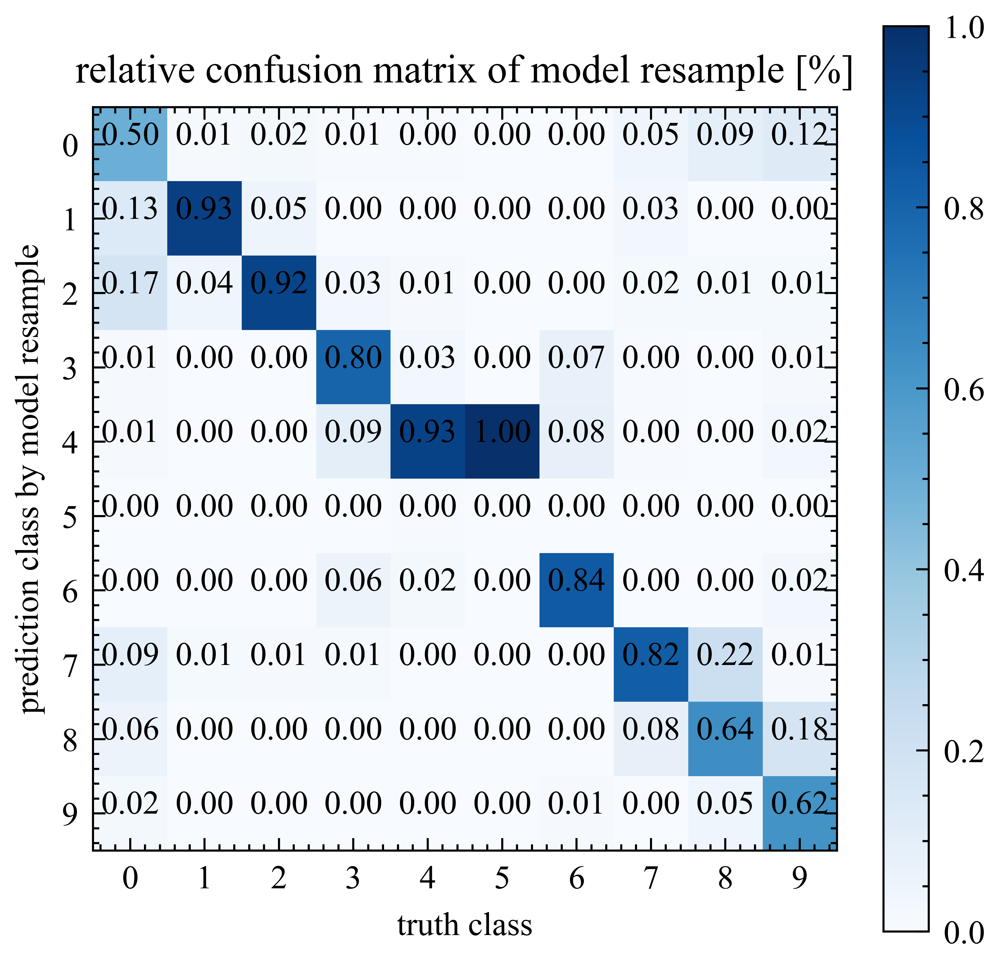

In [37]:
plt.style.use(['science','ieee'])
from matplotlib.pyplot import MultipleLocator

plt.figure(figsize=[4,4])

plt.imshow(confusion_matrix_per,interpolation='nearest', cmap=plt.cm.Blues)

plt.colorbar()

# 在每个色块上显示对应的数值
for i in range(confusion_matrix.shape[0]):
    for j in range(confusion_matrix.shape[1]):
        plt.text(j, i, format(confusion_matrix_per[i, j], '.2f'),
                 horizontalalignment="center",
                 color="black" if confusion_matrix_per[i, j] > 0.5 else "black")
plt.title('relative confusion matrix of model resample [%]')
plt.ylabel('prediction class by model resample')
plt.xlabel('truth class')

x_major_locator=MultipleLocator(1)
y_major_locator=MultipleLocator(1)
ax=plt.gca()
#ax为两条坐标轴的实例
ax.xaxis.set_major_locator(x_major_locator)
ax.yaxis.set_major_locator(y_major_locator)

===================Data Inspection===================


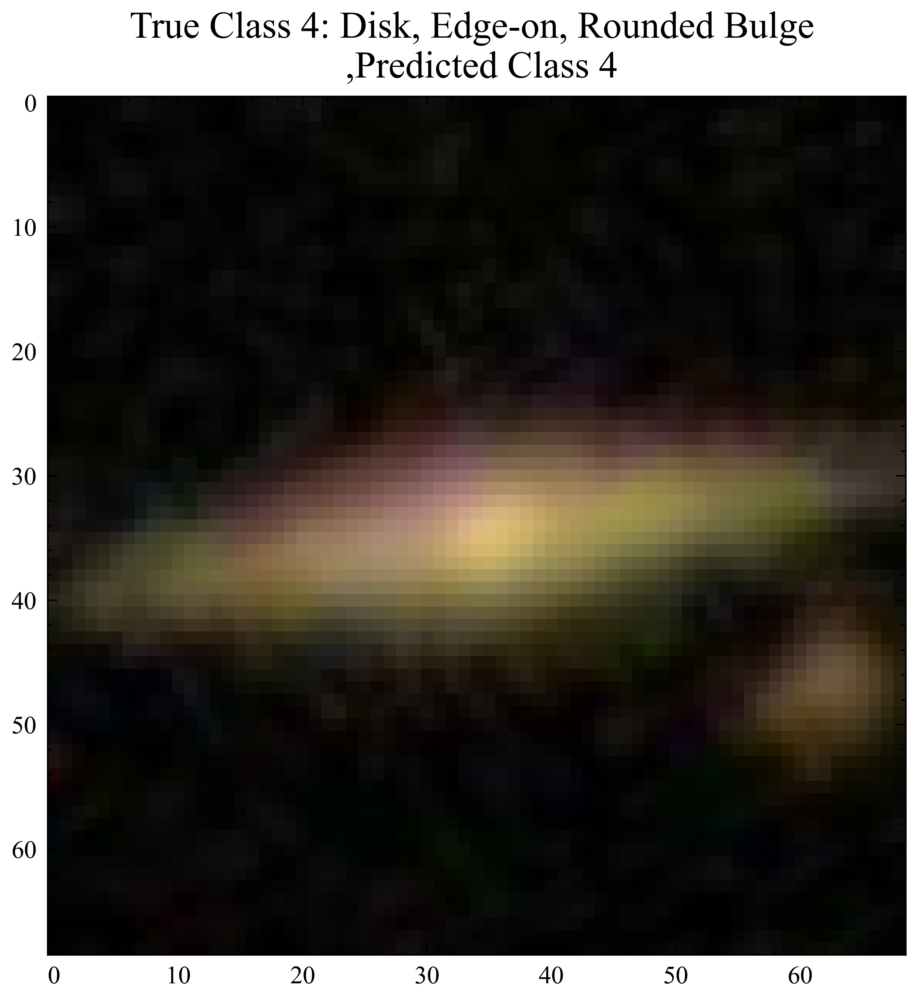

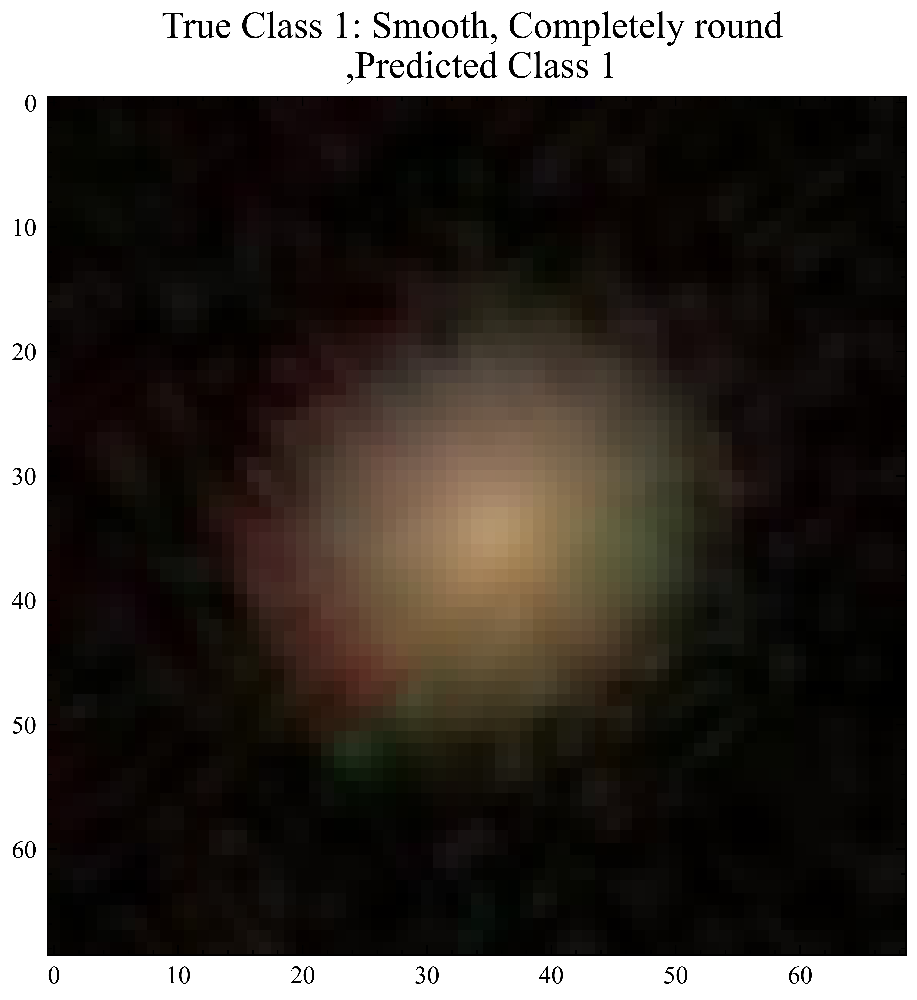

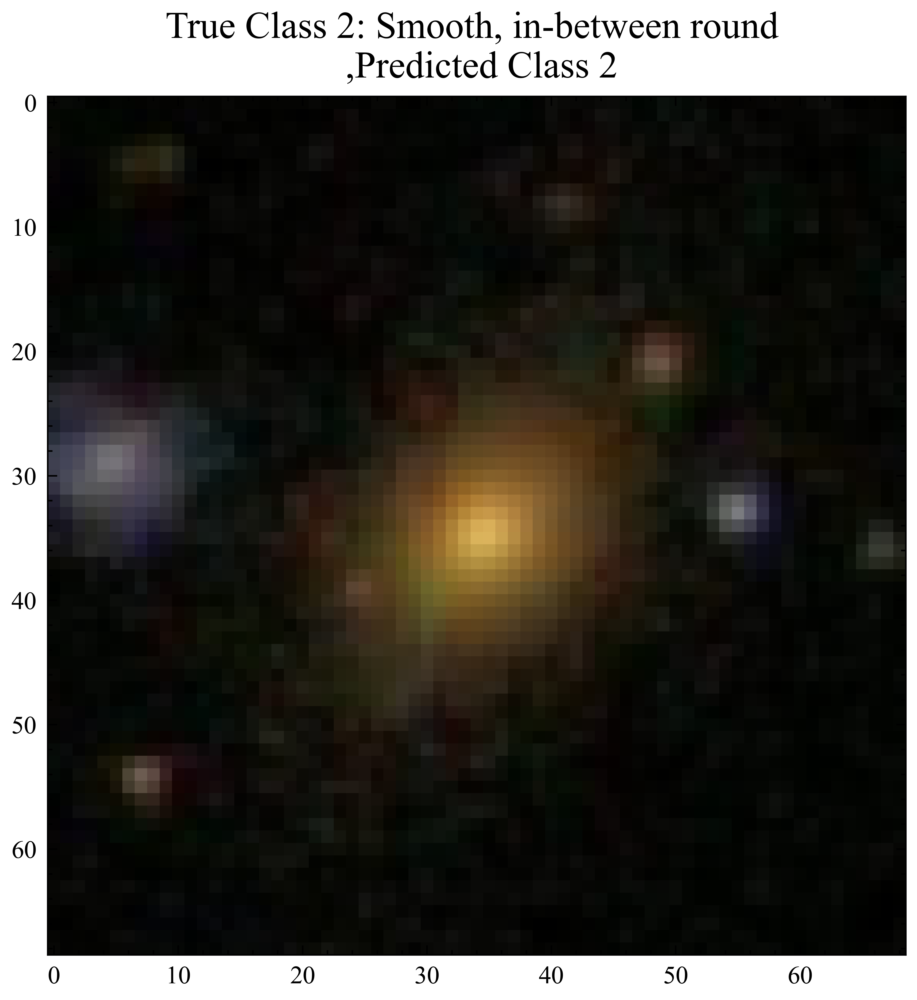

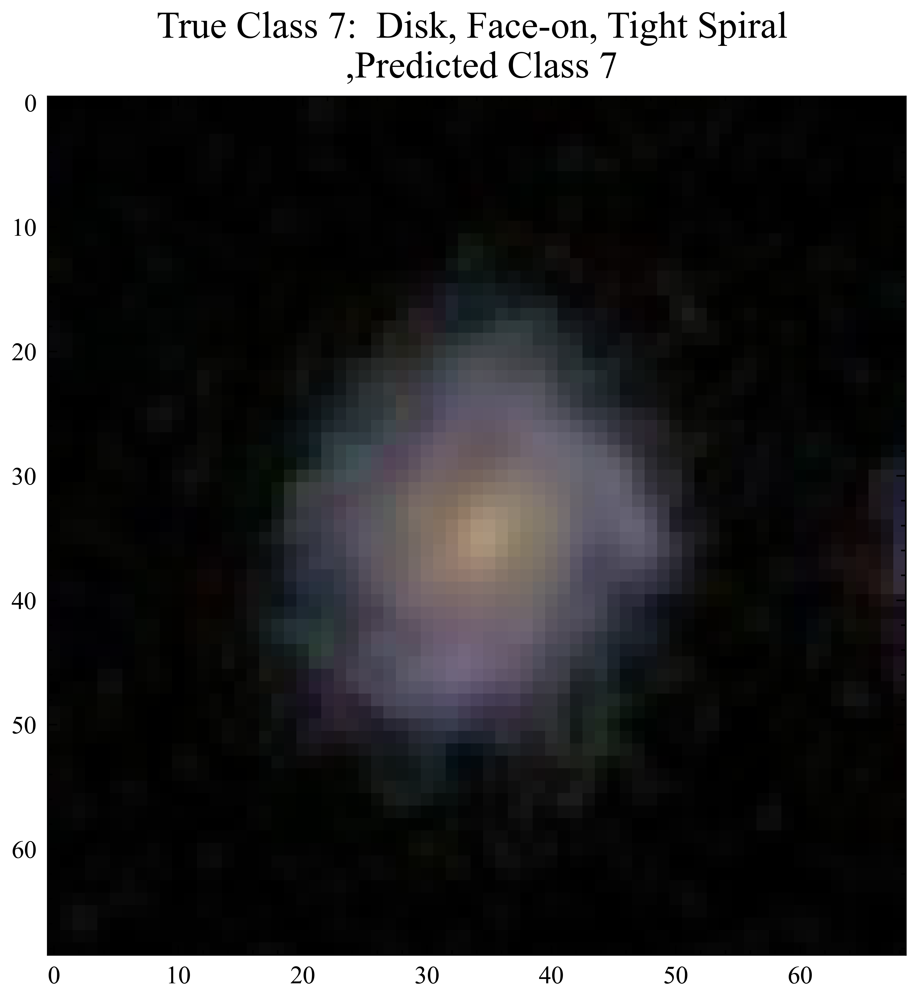

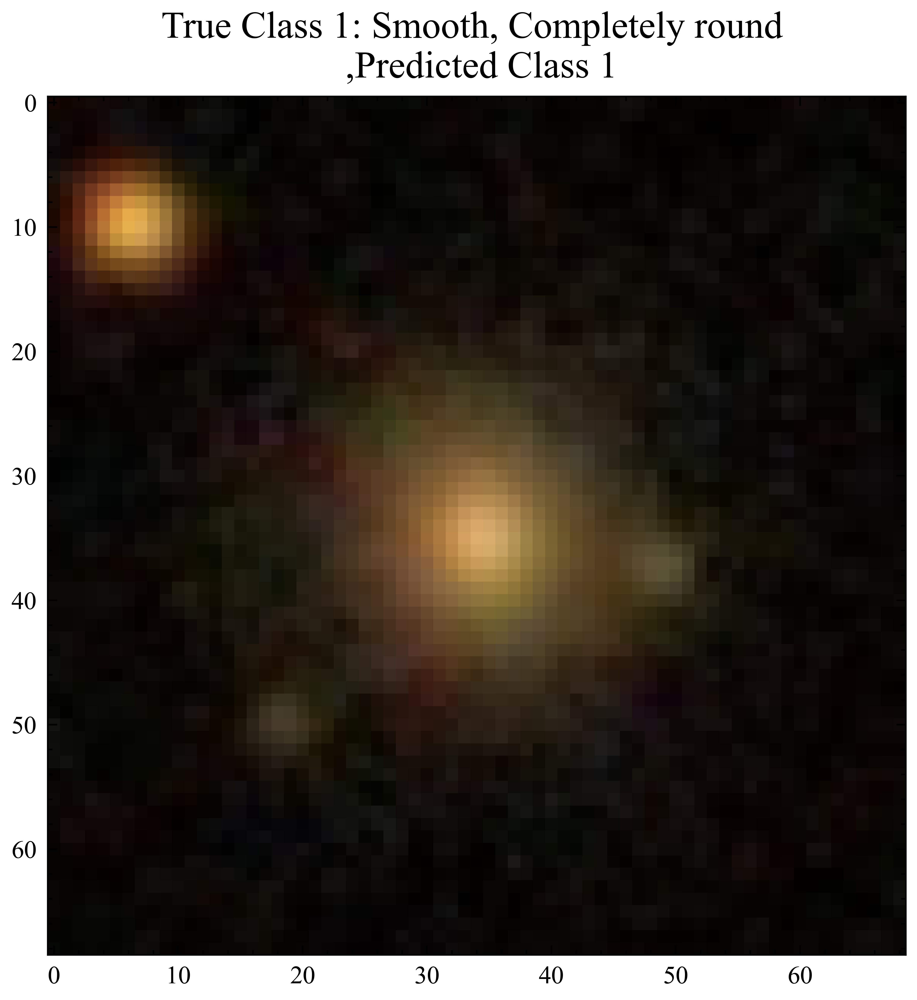

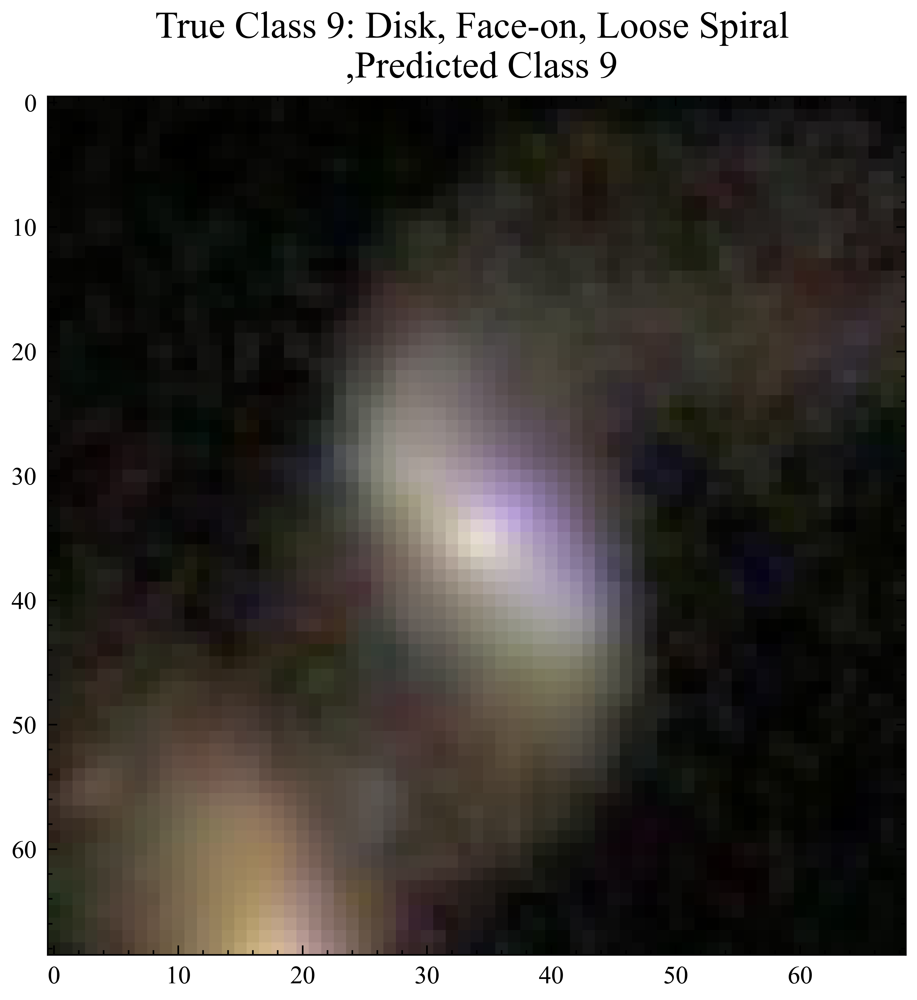

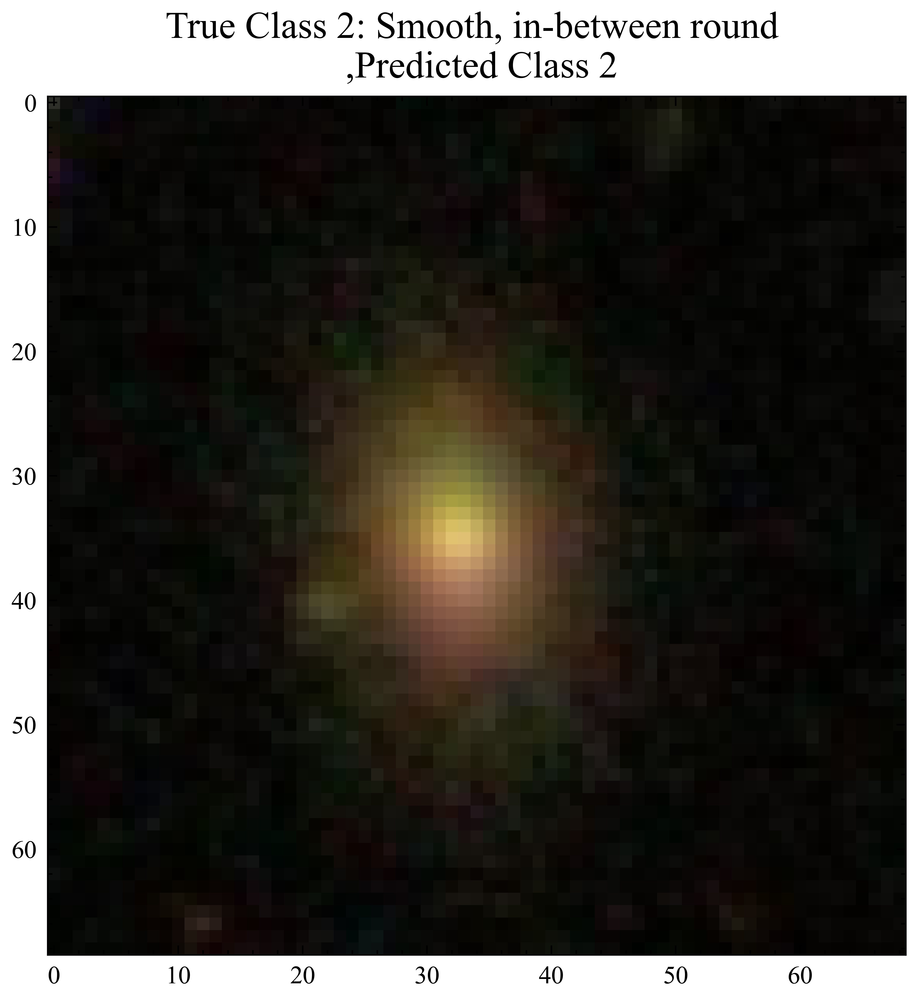

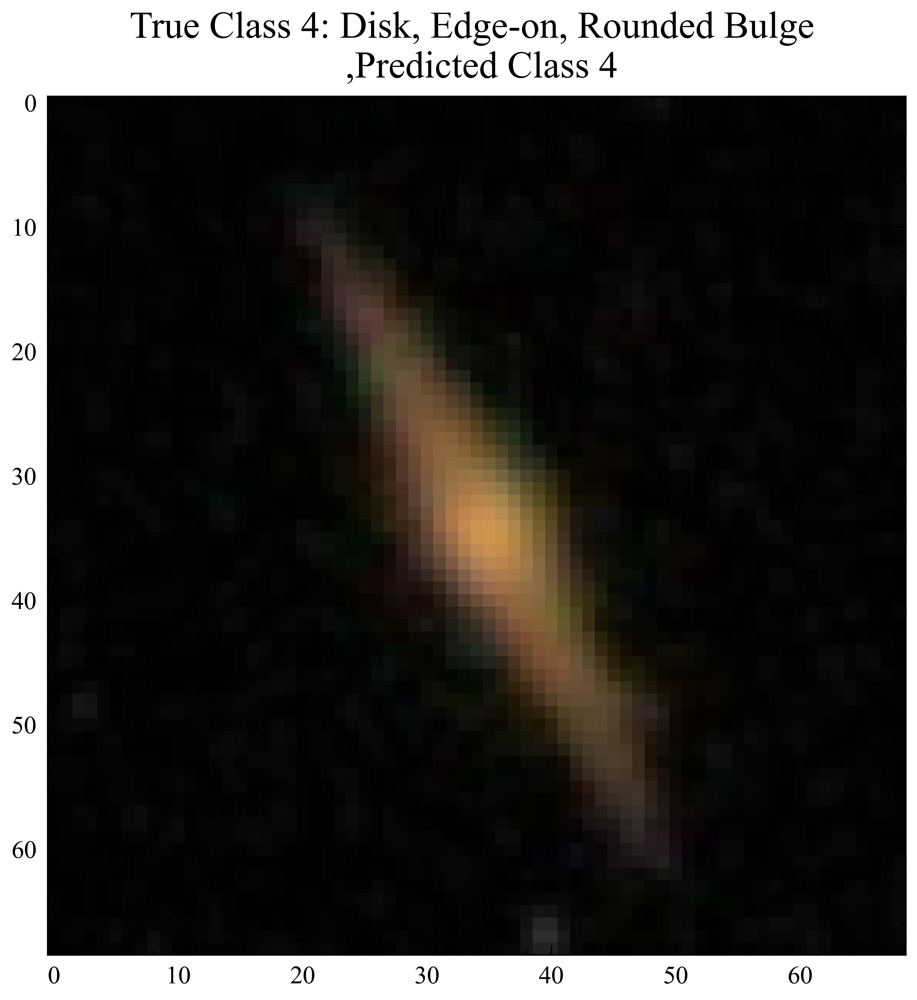

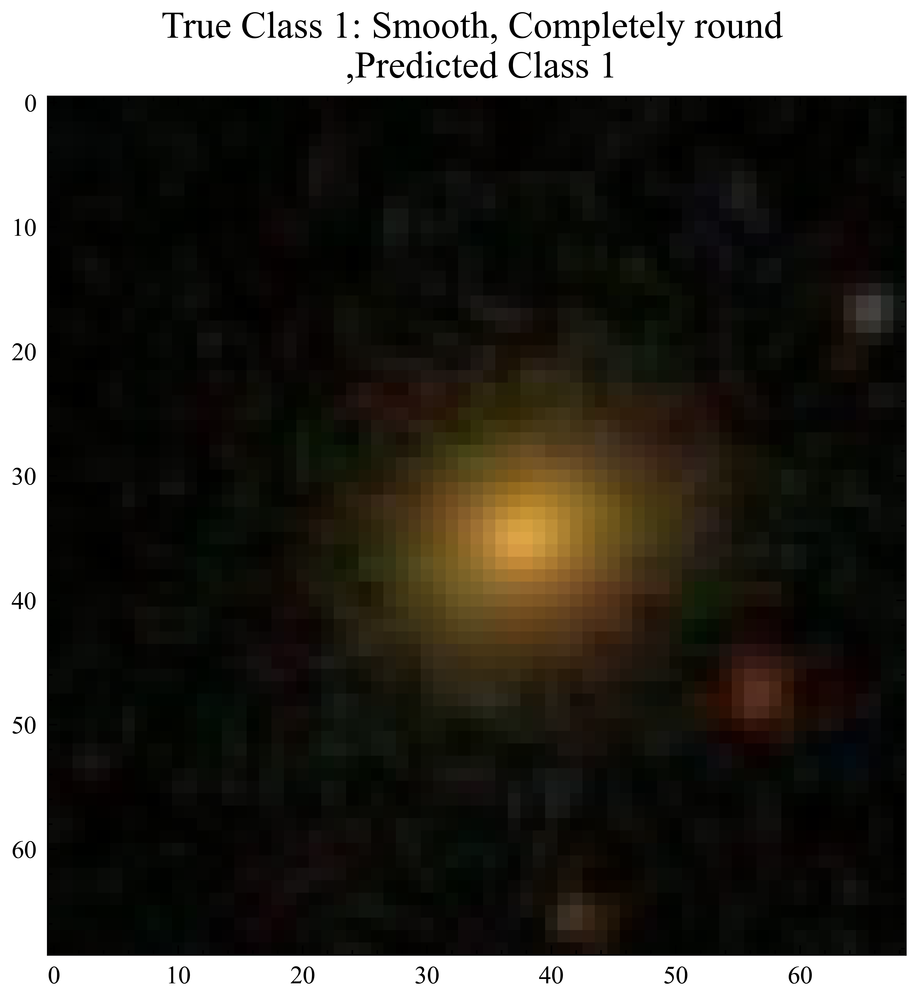

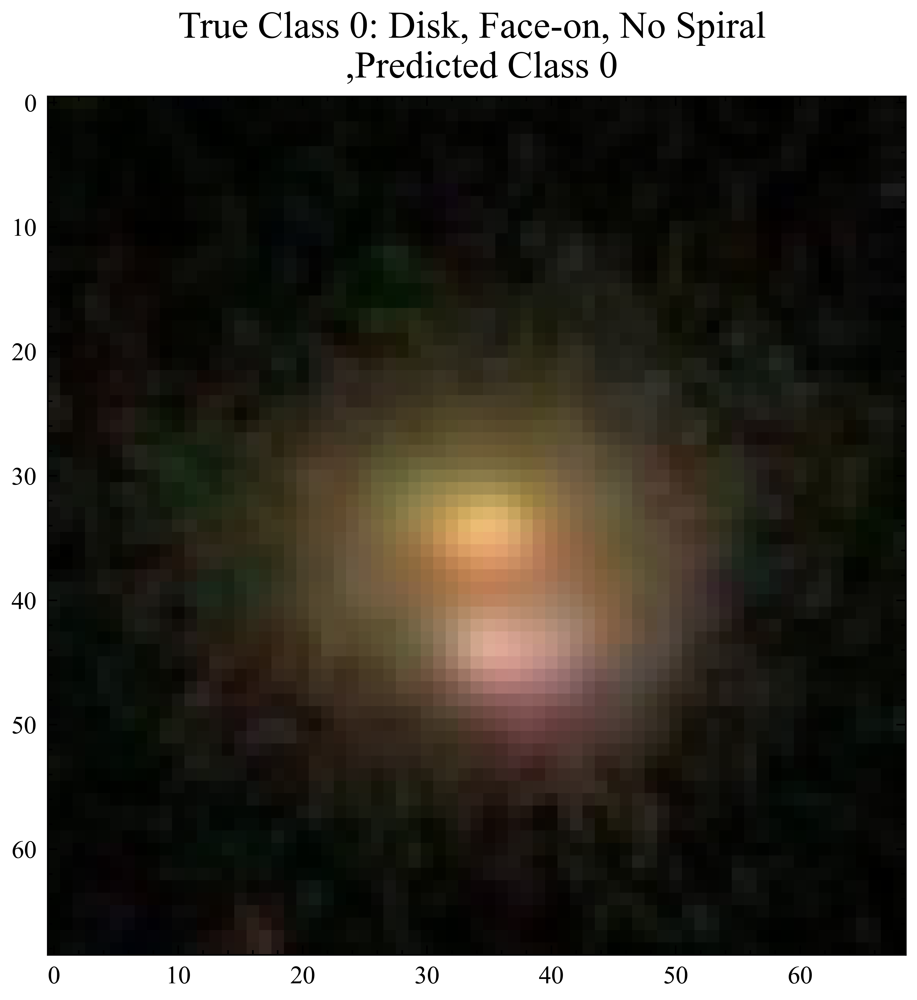

===============Data Inspection Finished===============


In [78]:
img = None
plt.ion()
print('===================Data Inspection===================')
count=0
for counter, i in enumerate(range(np.random.randint(0, test_idx.shape[0], size=50).shape[0])):
    
    if (pre_labels[i]==np.argmax(test_labels[i])) &(test_idx[i]<21785):
        
        num=np.argmax(test_labels[i])
    
        plt.figure(figsize=[5,5])
        img = plt.imshow(images[test_idx[i]]/255)
    
        plt.title('True Class {}: {} \n ,Predicted Class {}'.format(np.argmax(test_labels[i]), labelname[num], int(pre_labels[i])),fontsize=12)
        plt.draw()
        plt.pause(.5)
        count+=1
        if count>=10:
                  break
plt.close('all')
print('===============Data Inspection Finished===============')

In [77]:
labelname

['Disk, Face-on, No Spiral',
 'Smooth, Completely round',
 'Smooth, in-between round',
 'Smooth, Cigar shaped',
 'Disk, Edge-on, Rounded Bulge',
 'Disk, Edge-on, Boxy Bulge',
 ' Disk, Edge-on, No Bulge',
 ' Disk, Face-on, Tight Spiral',
 ' Disk, Face-on, Medium Spiral',
 'Disk, Face-on, Loose Spiral']

In [26]:
#增大网络规模 learning rate 1e-4
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPooling2D, GlobalAveragePooling2D, Dense, Add
from tensorflow.keras.models import Model
import numpy as np
import os
from tensorflow.keras.optimizers import Adam

# 定义基本块
def basic_block(x, filters, stride=1):
    #print("Input shape:", x.shape)
    shortcut = x

    # 第一个卷积层
    x = Conv2D(filters, kernel_size=(3, 3), strides=stride, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # 第二个卷积层
    x = Conv2D(filters, kernel_size=(3, 3), strides=1, padding='same')(x)
    x = BatchNormalization()(x)

    # 如果步幅不为 1，或输入和输出通道数不匹配，则需要对 shortcut 进行调整
    if stride != 1 or shortcut.shape[-1] != filters:
        shortcut = Conv2D(filters, kernel_size=(1, 1), strides=stride, padding='same')(shortcut)
        shortcut = BatchNormalization()(shortcut)
    #print("Skip connection shape:", x.shape)

    # 添加 shortcut 到主路径上
    x = Add()([x, shortcut])
    x = Activation('relu')(x)
    #print("Output shape:", x.shape)

    return x

# 定义 ResNet 结构
def ResNet(input_shape, num_classes):
    inputs = Input(shape=input_shape)

    # 第一层卷积
    x = Conv2D(64, kernel_size=(5, 5), strides=2, padding='same')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D(pool_size=(3, 3), strides=2, padding='same')(x)

    # 堆叠残差块
    x = basic_block(x, filters=64, stride=1)
    x = basic_block(x, filters=64, stride=1)
    x = basic_block(x, filters=64, stride=1)

    x = basic_block(x, filters=128, stride=2)
    x = basic_block(x, filters=128, stride=1)
    x = basic_block(x, filters=128, stride=1)
    x = basic_block(x, filters=128, stride=1)

    x = basic_block(x, filters=256, stride=2)
    x = basic_block(x, filters=256, stride=1)
    x = basic_block(x, filters=256, stride=1)
    x = basic_block(x, filters=256, stride=1)
    x = basic_block(x, filters=256, stride=1)
    x = basic_block(x, filters=256, stride=1)

    x = basic_block(x, filters=512, stride=2)
    x = basic_block(x, filters=512, stride=1)
    x = basic_block(x, filters=512, stride=1)

    # 全局平均池化
    x = GlobalAveragePooling2D()(x)

    # 全连接层 增加了两层
    x = Dense(256, activation='relu')(x)
    x = Dense(64, activation='relu')(x)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs, outputs)
    return model


def prepare_data(train_images, train_labels, test_images, test_labels):
    
    trlabels=np.zeros(train_labels.shape[0])
    telabels=np.zeros(test_labels.shape[0])
   
    for i in range(train_labels.shape[0]):
        trlabels[i]=np.argmax(train_labels[i])
    for i in range(test_labels.shape[0]):
        telabels[i]=np.argmax(test_labels[i])
    
    return trlabels,  telabels

# 模型训练
def train_model():
    input_shape = (69, 69, 3)
    num_classes = 10

    
    model = ResNet(input_shape, num_classes)
    model.summary()
    
    optimizer = Adam(learning_rate=0.0001)

# 将优化器对象传入compile函数中
    model.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

    trlabels,  telabels=prepare_data(train_images, train_labels, test_images, test_labels)
    
    # 训练模型并保存每个epoch的模型
    for epoch in range(30):  # 假设训练10个epoch
        model.fit(train_images, trlabels, batch_size=64, epochs=1, validation_data=(test_images, telabels))
        model.save(f'/data/dell5/userdir/chenhx/galaxy10/resnet_models_resample_dense_lr/resnet_epoch_{epoch+1}.h5')

    #model.fit(train_images, trlabels, epochs=10, batch_size=32, validation_data=(test_images, telabels))

    return model



# 有没有模型
if not os.path.exists('/data/dell5/userdir/chenhx/galaxy10/resnet_models_resample_dense_lr'):
    os.makedirs('/data/dell5/userdir/chenhx/galaxy10/resnet_models_resample_dense_lr')



trained_model = train_model()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 69, 69, 3)]          0         []                            
                                                                                                  
 conv2d_88 (Conv2D)          (None, 35, 35, 64)           4864      ['input_4[0][0]']             
                                                                                                  
 batch_normalization_88 (Ba  (None, 35, 35, 64)           256       ['conv2d_88[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_79 (Activation)  (None, 35, 35, 64)           0         ['batch_normalization_88

 conv2d_97 (Conv2D)          (None, 9, 9, 128)            8320      ['activation_85[0][0]']       
                                                                                                  
 batch_normalization_96 (Ba  (None, 9, 9, 128)            512       ['conv2d_96[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 batch_normalization_97 (Ba  (None, 9, 9, 128)            512       ['conv2d_97[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 add_41 (Add)                (None, 9, 9, 128)            0         ['batch_normalization_96[0][0]
                                                                    ',                            
          

                                                                                                  
 batch_normalization_105 (B  (None, 5, 5, 256)            1024      ['conv2d_105[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 batch_normalization_106 (B  (None, 5, 5, 256)            1024      ['conv2d_106[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 add_45 (Add)                (None, 5, 5, 256)            0         ['batch_normalization_105[0][0
                                                                    ]',                           
                                                                     'batch_normalization_106[0][0
          

 atchNormalization)                                                                               
                                                                                                  
 add_49 (Add)                (None, 5, 5, 256)            0         ['batch_normalization_114[0][0
                                                                    ]',                           
                                                                     'activation_101[0][0]']      
                                                                                                  
 activation_103 (Activation  (None, 5, 5, 256)            0         ['add_49[0][0]']              
 )                                                                                                
                                                                                                  
 conv2d_115 (Conv2D)         (None, 5, 5, 256)            590080    ['activation_103[0][0]']      
          

 conv2d_123 (Conv2D)         (None, 3, 3, 512)            2359808   ['activation_110[0][0]']      
                                                                                                  
 batch_normalization_123 (B  (None, 3, 3, 512)            2048      ['conv2d_123[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 add_53 (Add)                (None, 3, 3, 512)            0         ['batch_normalization_123[0][0
                                                                    ]',                           
                                                                     'activation_109[0][0]']      
                                                                                                  
 activation_111 (Activation  (None, 3, 3, 512)            0         ['add_53[0][0]']              
 )        

In [40]:
#增大网络规模 learning rate 1e-3
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPooling2D, GlobalAveragePooling2D, Dense, Add
from tensorflow.keras.models import Model
import numpy as np
import os
from tensorflow.keras.optimizers import Adam

# 定义基本块
def basic_block(x, filters, stride=1):
    #print("Input shape:", x.shape)
    shortcut = x

    # 第一个卷积层
    x = Conv2D(filters, kernel_size=(3, 3), strides=stride, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # 第二个卷积层
    x = Conv2D(filters, kernel_size=(3, 3), strides=1, padding='same')(x)
    x = BatchNormalization()(x)

    # 如果步幅不为 1，或输入和输出通道数不匹配，则需要对 shortcut 进行调整
    if stride != 1 or shortcut.shape[-1] != filters:
        shortcut = Conv2D(filters, kernel_size=(1, 1), strides=stride, padding='same')(shortcut)
        shortcut = BatchNormalization()(shortcut)
    #print("Skip connection shape:", x.shape)

    # 添加 shortcut 到主路径上
    x = Add()([x, shortcut])
    x = Activation('relu')(x)
    #print("Output shape:", x.shape)

    return x

# 定义 ResNet 结构
def ResNet(input_shape, num_classes):
    inputs = Input(shape=input_shape)

    # 第一层卷积
    x = Conv2D(64, kernel_size=(5, 5), strides=2, padding='same')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D(pool_size=(3, 3), strides=2, padding='same')(x)

    # 堆叠残差块
    x = basic_block(x, filters=64, stride=1)
    x = basic_block(x, filters=64, stride=1)
    x = basic_block(x, filters=64, stride=1)

    x = basic_block(x, filters=128, stride=2)
    x = basic_block(x, filters=128, stride=1)
    x = basic_block(x, filters=128, stride=1)
    x = basic_block(x, filters=128, stride=1)

    x = basic_block(x, filters=256, stride=2)
    x = basic_block(x, filters=256, stride=1)
    x = basic_block(x, filters=256, stride=1)
    x = basic_block(x, filters=256, stride=1)
    x = basic_block(x, filters=256, stride=1)
    x = basic_block(x, filters=256, stride=1)

    x = basic_block(x, filters=512, stride=2)
    x = basic_block(x, filters=512, stride=1)
    x = basic_block(x, filters=512, stride=1)

    # 全局平均池化
    x = GlobalAveragePooling2D()(x)

    # 全连接层 增加了两层
    x = Dense(256, activation='relu')(x)
    x = Dense(64, activation='relu')(x)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs, outputs)
    return model


def prepare_data(train_images, train_labels, test_images, test_labels):
    
    trlabels=np.zeros(train_labels.shape[0])
    telabels=np.zeros(test_labels.shape[0])
   
    for i in range(train_labels.shape[0]):
        trlabels[i]=np.argmax(train_labels[i])
    for i in range(test_labels.shape[0]):
        telabels[i]=np.argmax(test_labels[i])
    
    return trlabels,  telabels

# 模型训练
def train_model():
    input_shape = (69, 69, 3)
    num_classes = 10

    
    model = ResNet(input_shape, num_classes)
    model.summary()
    
    optimizer = Adam(learning_rate=0.0001)

# 将优化器对象传入compile函数中
    model.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

    trlabels,  telabels=prepare_data(train_images, train_labels, test_images, test_labels)
    
    # 训练模型并保存每个epoch的模型
    for epoch in range(30):  # 假设训练10个epoch
        model.fit(train_images, trlabels, batch_size=64, epochs=1, validation_data=(test_images, telabels))
        model.save(f'/data/dell5/userdir/chenhx/galaxy10/resnet_models_resample_dense/resnet_epoch_{epoch+1}.h5')

    #model.fit(train_images, trlabels, epochs=10, batch_size=32, validation_data=(test_images, telabels))

    return model



# 有没有模型
if not os.path.exists('/data/dell5/userdir/chenhx/galaxy10/resnet_models_resample_dense'):
    os.makedirs('/data/dell5/userdir/chenhx/galaxy10/resnet_models_resample_dense')


trained_model = train_model()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 69, 69, 3)]          0         []                            
                                                                                                  
 conv2d_124 (Conv2D)         (None, 35, 35, 64)           4864      ['input_5[0][0]']             
                                                                                                  
 batch_normalization_124 (B  (None, 35, 35, 64)           256       ['conv2d_124[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_112 (Activation  (None, 35, 35, 64)           0         ['batch_normalization_12

                                                                                                  
 conv2d_132 (Conv2D)         (None, 9, 9, 128)            147584    ['activation_119[0][0]']      
                                                                                                  
 conv2d_133 (Conv2D)         (None, 9, 9, 128)            8320      ['activation_118[0][0]']      
                                                                                                  
 batch_normalization_132 (B  (None, 9, 9, 128)            512       ['conv2d_132[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 batch_normalization_133 (B  (None, 9, 9, 128)            512       ['conv2d_133[0][0]']          
 atchNormalization)                                                                               
          

                                                                                                  
 activation_127 (Activation  (None, 5, 5, 256)            0         ['batch_normalization_140[0][0
 )                                                                  ]']                           
                                                                                                  
 conv2d_141 (Conv2D)         (None, 5, 5, 256)            590080    ['activation_127[0][0]']      
                                                                                                  
 conv2d_142 (Conv2D)         (None, 5, 5, 256)            33024     ['activation_126[0][0]']      
                                                                                                  
 batch_normalization_141 (B  (None, 5, 5, 256)            1024      ['conv2d_141[0][0]']          
 atchNormalization)                                                                               
          

                                                                                                  
 batch_normalization_149 (B  (None, 5, 5, 256)            1024      ['conv2d_149[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_135 (Activation  (None, 5, 5, 256)            0         ['batch_normalization_149[0][0
 )                                                                  ]']                           
                                                                                                  
 conv2d_150 (Conv2D)         (None, 5, 5, 256)            590080    ['activation_135[0][0]']      
                                                                                                  
 batch_normalization_150 (B  (None, 5, 5, 256)            1024      ['conv2d_150[0][0]']          
 atchNorma

 )                                                                                                
                                                                                                  
 conv2d_158 (Conv2D)         (None, 3, 3, 512)            2359808   ['activation_142[0][0]']      
                                                                                                  
 batch_normalization_158 (B  (None, 3, 3, 512)            2048      ['conv2d_158[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_143 (Activation  (None, 3, 3, 512)            0         ['batch_normalization_158[0][0
 )                                                                  ]']                           
                                                                                                  
 conv2d_15

KeyboardInterrupt: 

In [41]:
#增大网络规模 learning rate 1e-3
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPooling2D, GlobalAveragePooling2D, Dense, Add
from tensorflow.keras.models import Model
import numpy as np
import os
from tensorflow.keras.optimizers import Adam

# 定义基本块
def basic_block(x, filters, stride=1):
    #print("Input shape:", x.shape)
    shortcut = x

    # 第一个卷积层
    x = Conv2D(filters, kernel_size=(3, 3), strides=stride, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # 第二个卷积层
    x = Conv2D(filters, kernel_size=(3, 3), strides=1, padding='same')(x)
    x = BatchNormalization()(x)

    # 如果步幅不为 1，或输入和输出通道数不匹配，则需要对 shortcut 进行调整
    if stride != 1 or shortcut.shape[-1] != filters:
        shortcut = Conv2D(filters, kernel_size=(1, 1), strides=stride, padding='same')(shortcut)
        shortcut = BatchNormalization()(shortcut)
    #print("Skip connection shape:", x.shape)

    # 添加 shortcut 到主路径上
    x = Add()([x, shortcut])
    x = Activation('relu')(x)
    #print("Output shape:", x.shape)

    return x

# 定义 ResNet 结构
def ResNet(input_shape, num_classes):
    inputs = Input(shape=input_shape)

    # 第一层卷积
    x = Conv2D(64, kernel_size=(5, 5), strides=2, padding='same')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D(pool_size=(3, 3), strides=2, padding='same')(x)

    # 堆叠残差块
    x = basic_block(x, filters=64, stride=1)
    x = basic_block(x, filters=64, stride=1)
    x = basic_block(x, filters=64, stride=1)

    x = basic_block(x, filters=128, stride=2)
    x = basic_block(x, filters=128, stride=1)
    x = basic_block(x, filters=128, stride=1)
    x = basic_block(x, filters=128, stride=1)

    x = basic_block(x, filters=256, stride=2)
    x = basic_block(x, filters=256, stride=1)
    x = basic_block(x, filters=256, stride=1)
    x = basic_block(x, filters=256, stride=1)
    x = basic_block(x, filters=256, stride=1)
    x = basic_block(x, filters=256, stride=1)

    x = basic_block(x, filters=512, stride=2)
    x = basic_block(x, filters=512, stride=1)
    x = basic_block(x, filters=512, stride=1)

    # 全局平均池化
    x = GlobalAveragePooling2D()(x)

    # 全连接层 增加了两层
    x = Dense(256, activation='relu')(x)
    x = Dense(64, activation='relu')(x)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs, outputs)
    return model


def prepare_data(train_images, train_labels, test_images, test_labels):
    
    trlabels=np.zeros(train_labels.shape[0])
    telabels=np.zeros(test_labels.shape[0])
   
    for i in range(train_labels.shape[0]):
        trlabels[i]=np.argmax(train_labels[i])
    for i in range(test_labels.shape[0]):
        telabels[i]=np.argmax(test_labels[i])
    
    return trlabels,  telabels

# 模型训练
def train_model():
    input_shape = (69, 69, 3)
    num_classes = 10

    
    model = ResNet(input_shape, num_classes)
    model.summary()
    
    optimizer = Adam(learning_rate=0.001)

# 将优化器对象传入compile函数中
    model.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

    trlabels,  telabels=prepare_data(train_images, train_labels, test_images, test_labels)
    
    # 训练模型并保存每个epoch的模型
    for epoch in range(30):  # 假设训练10个epoch
        model.fit(train_images, trlabels, batch_size=64, epochs=1, validation_data=(test_images, telabels))
        model.save(f'/data/dell5/userdir/chenhx/galaxy10/resnet_models_resample_dense2/resnet_epoch_{epoch+1}.h5')

    #model.fit(train_images, trlabels, epochs=10, batch_size=32, validation_data=(test_images, telabels))

    return model



# 有没有模型
if not os.path.exists('/data/dell5/userdir/chenhx/galaxy10/resnet_models_resample_dense2'):
    os.makedirs('/data/dell5/userdir/chenhx/galaxy10/resnet_models_resample_dense2')


trained_model = train_model()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 69, 69, 3)]          0         []                            
                                                                                                  
 conv2d_160 (Conv2D)         (None, 35, 35, 64)           4864      ['input_6[0][0]']             
                                                                                                  
 batch_normalization_160 (B  (None, 35, 35, 64)           256       ['conv2d_160[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_145 (Activation  (None, 35, 35, 64)           0         ['batch_normalization_16

                                                                                                  
 conv2d_168 (Conv2D)         (None, 9, 9, 128)            147584    ['activation_152[0][0]']      
                                                                                                  
 conv2d_169 (Conv2D)         (None, 9, 9, 128)            8320      ['activation_151[0][0]']      
                                                                                                  
 batch_normalization_168 (B  (None, 9, 9, 128)            512       ['conv2d_168[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 batch_normalization_169 (B  (None, 9, 9, 128)            512       ['conv2d_169[0][0]']          
 atchNormalization)                                                                               
          

                                                                                                  
 activation_160 (Activation  (None, 5, 5, 256)            0         ['batch_normalization_176[0][0
 )                                                                  ]']                           
                                                                                                  
 conv2d_177 (Conv2D)         (None, 5, 5, 256)            590080    ['activation_160[0][0]']      
                                                                                                  
 conv2d_178 (Conv2D)         (None, 5, 5, 256)            33024     ['activation_159[0][0]']      
                                                                                                  
 batch_normalization_177 (B  (None, 5, 5, 256)            1024      ['conv2d_177[0][0]']          
 atchNormalization)                                                                               
          

                                                                                                  
 batch_normalization_185 (B  (None, 5, 5, 256)            1024      ['conv2d_185[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_168 (Activation  (None, 5, 5, 256)            0         ['batch_normalization_185[0][0
 )                                                                  ]']                           
                                                                                                  
 conv2d_186 (Conv2D)         (None, 5, 5, 256)            590080    ['activation_168[0][0]']      
                                                                                                  
 batch_normalization_186 (B  (None, 5, 5, 256)            1024      ['conv2d_186[0][0]']          
 atchNorma

 )                                                                                                
                                                                                                  
 conv2d_194 (Conv2D)         (None, 3, 3, 512)            2359808   ['activation_175[0][0]']      
                                                                                                  
 batch_normalization_194 (B  (None, 3, 3, 512)            2048      ['conv2d_194[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_176 (Activation  (None, 3, 3, 512)            0         ['batch_normalization_194[0][0
 )                                                                  ]']                           
                                                                                                  
 conv2d_19

In [43]:
# 模型测试
def test_model(model):
    
    loss, accuracy = model.evaluate(test_images, telabels)
    print("Test Loss:", loss)
    print("Test Accuracy:", accuracy)
    
#输出结果
def predict_image(test_images, telabels, model):
    
    predictions = model.predict(test_images)
    predicted_label=np.zeros(predictions.shape[0])
    for i in range(predictions.shape[0]):
        predicted_label[i] = np.argmax(predictions[i])
    return predicted_label


loaded_model = tf.keras.models.load_model('/data/dell5/userdir/chenhx/galaxy10/resnet_models_resample_dense2/resnet_epoch_15.h5')
trlabels,  telabels=prepare_data(train_images, train_labels, test_images, test_labels)
pre_labels=predict_image(test_images, telabels, loaded_model)

116/116 [==============================] - 8s 63ms/step


In [44]:
confusion_matrix = np.zeros((10,10))

# create the confusion matrix
for i in range(telabels.shape[0]):
    confusion_matrix[int(pre_labels[i]),int(telabels[i]) ] += 1

confusion_matrix_per = confusion_matrix.copy()

# create the confusion matrix
for i in range(10):
    confusion_matrix_per[i,:] /=np.sum(confusion_matrix,0)

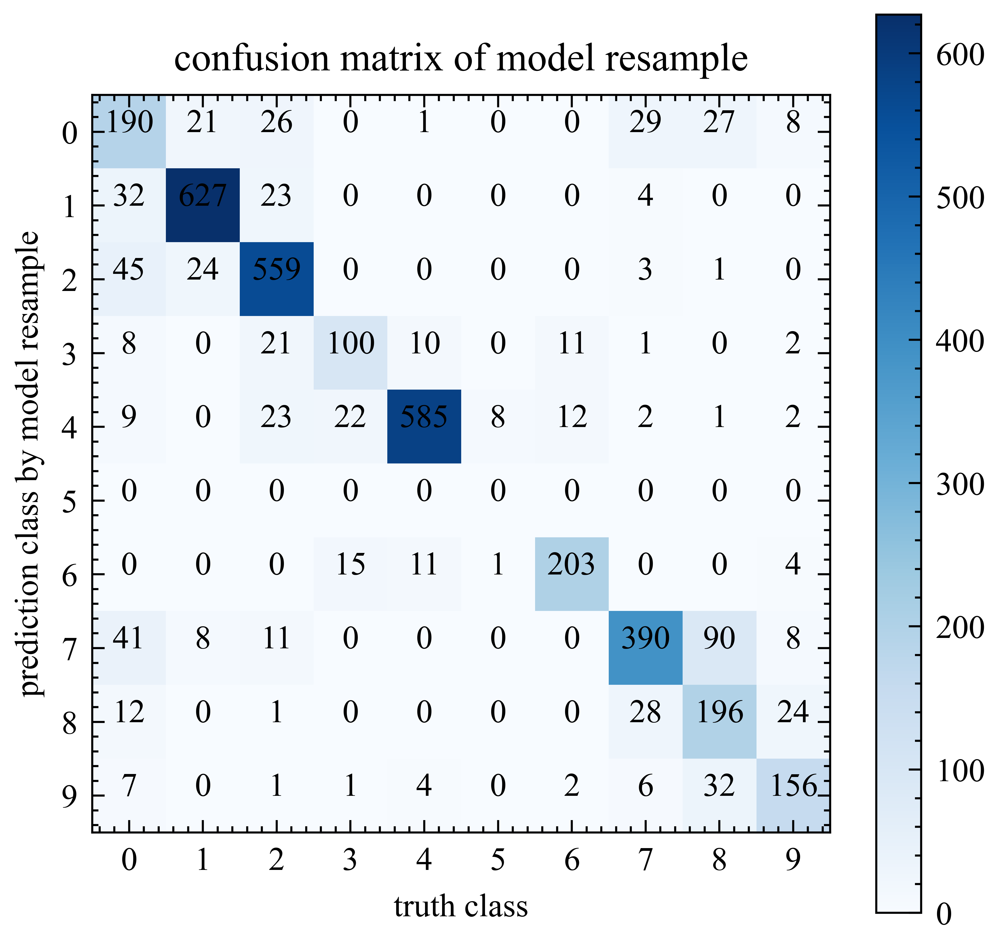

In [45]:
plt.style.use(['science','ieee'])
from matplotlib.pyplot import MultipleLocator

plt.figure(figsize=[4,4])

plt.imshow(confusion_matrix,interpolation='nearest', cmap=plt.cm.Blues)

plt.colorbar()

# 在每个色块上显示对应的数值
for i in range(confusion_matrix.shape[0]):
    for j in range(confusion_matrix.shape[1]):
        plt.text(j, i, format(confusion_matrix[i, j], '.0f'),
                 horizontalalignment="center",
                 color="black" if confusion_matrix[i, j] > 0.5 else "black")
plt.title('confusion matrix of model resample')
plt.ylabel('prediction class by model resample')
plt.xlabel('truth class')

x_major_locator=MultipleLocator(1)
y_major_locator=MultipleLocator(1)
ax=plt.gca()
#ax为两条坐标轴的实例
ax.xaxis.set_major_locator(x_major_locator)
ax.yaxis.set_major_locator(y_major_locator)


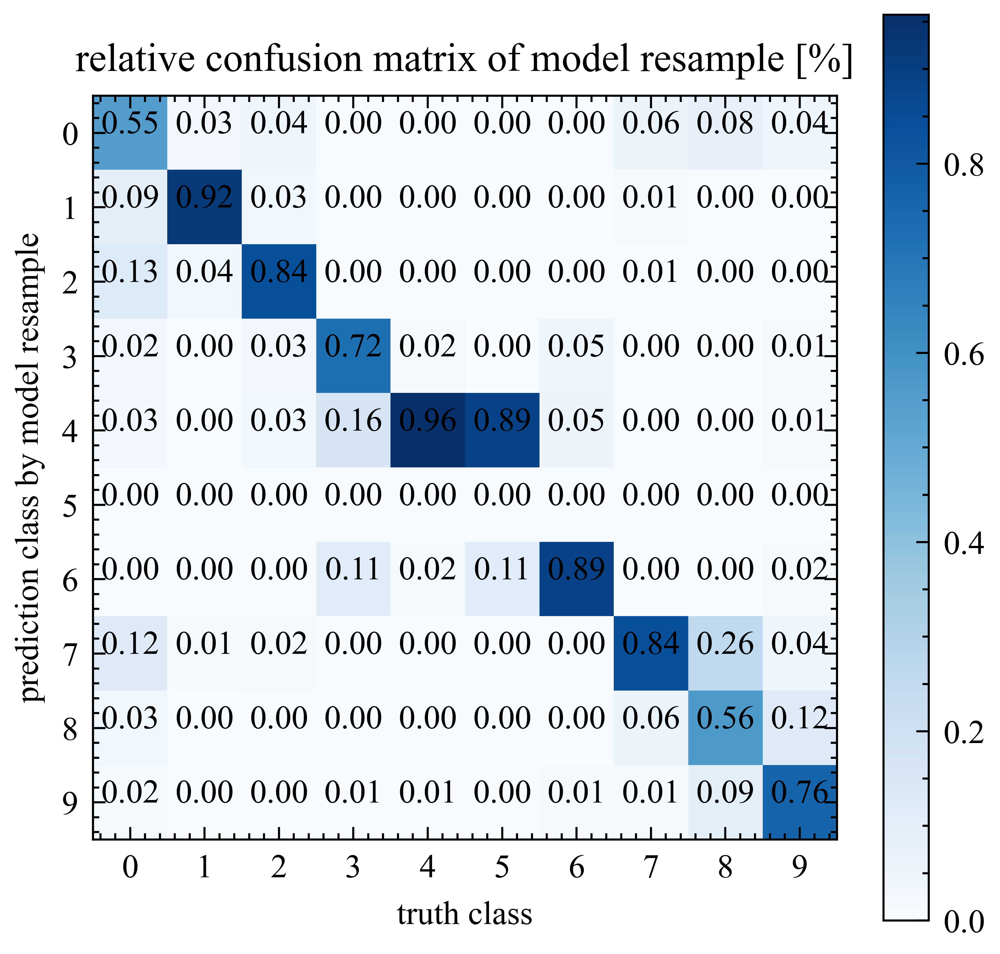

In [46]:
plt.style.use(['science','ieee'])
from matplotlib.pyplot import MultipleLocator

plt.figure(figsize=[4,4])

plt.imshow(confusion_matrix_per,interpolation='nearest', cmap=plt.cm.Blues)

plt.colorbar()

# 在每个色块上显示对应的数值
for i in range(confusion_matrix.shape[0]):
    for j in range(confusion_matrix.shape[1]):
        plt.text(j, i, format(confusion_matrix_per[i, j], '.2f'),
                 horizontalalignment="center",
                 color="black" if confusion_matrix_per[i, j] > 0.5 else "black")
plt.title('relative confusion matrix of model resample [%]')
plt.ylabel('prediction class by model resample')
plt.xlabel('truth class')

x_major_locator=MultipleLocator(1)
y_major_locator=MultipleLocator(1)
ax=plt.gca()
#ax为两条坐标轴的实例
ax.xaxis.set_major_locator(x_major_locator)
ax.yaxis.set_major_locator(y_major_locator)

In [42]:
#增大网络规模 learning rate 3e-3
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPooling2D, GlobalAveragePooling2D, Dense, Add
from tensorflow.keras.models import Model
import numpy as np
import os
from tensorflow.keras.optimizers import Adam

# 定义基本块
def basic_block(x, filters, stride=1):
    #print("Input shape:", x.shape)
    shortcut = x

    # 第一个卷积层
    x = Conv2D(filters, kernel_size=(3, 3), strides=stride, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # 第二个卷积层
    x = Conv2D(filters, kernel_size=(3, 3), strides=1, padding='same')(x)
    x = BatchNormalization()(x)

    # 如果步幅不为 1，或输入和输出通道数不匹配，则需要对 shortcut 进行调整
    if stride != 1 or shortcut.shape[-1] != filters:
        shortcut = Conv2D(filters, kernel_size=(1, 1), strides=stride, padding='same')(shortcut)
        shortcut = BatchNormalization()(shortcut)
    #print("Skip connection shape:", x.shape)

    # 添加 shortcut 到主路径上
    x = Add()([x, shortcut])
    x = Activation('relu')(x)
    #print("Output shape:", x.shape)

    return x

# 定义 ResNet 结构
def ResNet(input_shape, num_classes):
    inputs = Input(shape=input_shape)

    # 第一层卷积
    x = Conv2D(64, kernel_size=(5, 5), strides=2, padding='same')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D(pool_size=(3, 3), strides=2, padding='same')(x)

    # 堆叠残差块
    x = basic_block(x, filters=64, stride=1)
    x = basic_block(x, filters=64, stride=1)
    x = basic_block(x, filters=64, stride=1)

    x = basic_block(x, filters=128, stride=2)
    x = basic_block(x, filters=128, stride=1)
    x = basic_block(x, filters=128, stride=1)
    x = basic_block(x, filters=128, stride=1)

    x = basic_block(x, filters=256, stride=2)
    x = basic_block(x, filters=256, stride=1)
    x = basic_block(x, filters=256, stride=1)
    x = basic_block(x, filters=256, stride=1)
    x = basic_block(x, filters=256, stride=1)
    x = basic_block(x, filters=256, stride=1)

    x = basic_block(x, filters=512, stride=2)
    x = basic_block(x, filters=512, stride=1)
    x = basic_block(x, filters=512, stride=1)

    # 全局平均池化
    x = GlobalAveragePooling2D()(x)

    # 全连接层 增加了两层
    x = Dense(256, activation='relu')(x)
    x = Dense(64, activation='relu')(x)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs, outputs)
    return model


def prepare_data(train_images, train_labels, test_images, test_labels):
    
    trlabels=np.zeros(train_labels.shape[0])
    telabels=np.zeros(test_labels.shape[0])
   
    for i in range(train_labels.shape[0]):
        trlabels[i]=np.argmax(train_labels[i])
    for i in range(test_labels.shape[0]):
        telabels[i]=np.argmax(test_labels[i])
    
    return trlabels,  telabels

# 模型训练
def train_model():
    input_shape = (69, 69, 3)
    num_classes = 10

    
    model = ResNet(input_shape, num_classes)
    model.summary()
    
    optimizer = Adam(learning_rate=0.003)

# 将优化器对象传入compile函数中
    model.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

    trlabels,  telabels=prepare_data(train_images, train_labels, test_images, test_labels)
    
    # 训练模型并保存每个epoch的模型
    for epoch in range(30):  # 假设训练10个epoch
        model.fit(train_images, trlabels, batch_size=64, epochs=1, validation_data=(test_images, telabels))
        model.save(f'/data/dell5/userdir/chenhx/galaxy10/resnet_models_resample_dense3/resnet_epoch_{epoch+1}.h5')

    #model.fit(train_images, trlabels, epochs=10, batch_size=32, validation_data=(test_images, telabels))

    return model



# 有没有模型
if not os.path.exists('/data/dell5/userdir/chenhx/galaxy10/resnet_models_resample_dense3'):
    os.makedirs('/data/dell5/userdir/chenhx/galaxy10/resnet_models_resample_dense3')


trained_model = train_model()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_7 (InputLayer)        [(None, 69, 69, 3)]          0         []                            
                                                                                                  
 conv2d_196 (Conv2D)         (None, 35, 35, 64)           4864      ['input_7[0][0]']             
                                                                                                  
 batch_normalization_196 (B  (None, 35, 35, 64)           256       ['conv2d_196[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_178 (Activation  (None, 35, 35, 64)           0         ['batch_normalization_19

                                                                                                  
 conv2d_204 (Conv2D)         (None, 9, 9, 128)            147584    ['activation_185[0][0]']      
                                                                                                  
 conv2d_205 (Conv2D)         (None, 9, 9, 128)            8320      ['activation_184[0][0]']      
                                                                                                  
 batch_normalization_204 (B  (None, 9, 9, 128)            512       ['conv2d_204[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 batch_normalization_205 (B  (None, 9, 9, 128)            512       ['conv2d_205[0][0]']          
 atchNormalization)                                                                               
          

                                                                                                  
 activation_193 (Activation  (None, 5, 5, 256)            0         ['batch_normalization_212[0][0
 )                                                                  ]']                           
                                                                                                  
 conv2d_213 (Conv2D)         (None, 5, 5, 256)            590080    ['activation_193[0][0]']      
                                                                                                  
 conv2d_214 (Conv2D)         (None, 5, 5, 256)            33024     ['activation_192[0][0]']      
                                                                                                  
 batch_normalization_213 (B  (None, 5, 5, 256)            1024      ['conv2d_213[0][0]']          
 atchNormalization)                                                                               
          

                                                                                                  
 batch_normalization_221 (B  (None, 5, 5, 256)            1024      ['conv2d_221[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_201 (Activation  (None, 5, 5, 256)            0         ['batch_normalization_221[0][0
 )                                                                  ]']                           
                                                                                                  
 conv2d_222 (Conv2D)         (None, 5, 5, 256)            590080    ['activation_201[0][0]']      
                                                                                                  
 batch_normalization_222 (B  (None, 5, 5, 256)            1024      ['conv2d_222[0][0]']          
 atchNorma

 )                                                                                                
                                                                                                  
 conv2d_230 (Conv2D)         (None, 3, 3, 512)            2359808   ['activation_208[0][0]']      
                                                                                                  
 batch_normalization_230 (B  (None, 3, 3, 512)            2048      ['conv2d_230[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_209 (Activation  (None, 3, 3, 512)            0         ['batch_normalization_230[0][0
 )                                                                  ]']                           
                                                                                                  
 conv2d_23